**Bayesian Optimisation for hyperparameter configuration**

**Set random seed for reproducability**

In [1]:
import os
import numpy as np 
import tensorflow as tf
randseed = 42
np.random.seed(randseed)
tf.random.set_seed(randseed)
os.environ['PYTHONHASHSEED']=str(randseed)

**Import packages**

In [2]:
import pandas as pd 
import matplotlib.pyplot as plt 
from keras import backend as K
from keras.models import Sequential, load_model 
from keras.layers import Dense, Dropout, LSTM 
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler  
from sklearn.metrics import  mean_squared_error, mean_absolute_error, r2_score
import skopt
from skopt import gp_minimize
from skopt.utils import use_named_args
from skopt.space import Real, Categorical, Integer

**Read in dataset**

In [3]:
#Read in the Dataset
original = pd.read_csv('/kaggle/input/stocks/ABG.csv') 
original['Date'] = pd.to_datetime(original.Date) 
original.head()

,Date,Open,High,Low,Close,Volume,Earnings Yield (EY),Dividend Yield (DY),P:E Ratio (P:E),Trades,Trade Value,Total Return Index (TRI)
0,1999-01-01,2790,2800,2750,2790,0,10.4,3.3,9.615385,-,-,669.0
1,1999-01-04,2790,2900,2700,2850,240401,10.2,3.2,9.803922,-,-,684.0
2,1999-01-05,2850,2900,2810,2875,339749,10.1,3.2,9.900990,-,-,690.0
3,1999-01-06,2915,3070,2915,3050,2110485,9.5,3.0,10.526316,-,-,732.0
4,1999-01-07,3135,3450,3135,3250,3757292,9.0,2.8,11.111111,-,-,780.0


**Feature Engineering:**

*   Variations of Log Returns
*   Total Return Index (TRI)
*   Simple Moving Average (SMA) - 20, 50, 200 days
*   Exponentially-weighted Moving Average (EWMA) - 20, 50, 200 days
*   Moving Average Convergence Divergence (MACD)
*   Relative Strength Index (RSI) - 14 days
*   Moving Average Convergence Divergence (MACD)

In [4]:
forecastHorizon = 5

#Create new dataframe
df = pd.DataFrame(data = original['Date'])  

#Target Returns (Weekly)
df['Target'] = np.log(original['Close'].shift(-forecastHorizon) / original['Close'])

#Returns from the closing price
df['Returns'] = np.log((original['Close']) / original['Close'].shift(forecastHorizon))

#Lagged Variations of returns
df['Returns1'] = np.log((original['Close']) / original['Close'].shift(1))
df['Returns2'] = np.log((original['Close']) / original['Close'].shift(2))
df['Returns3'] = np.log((original['Close']) / original['Close'].shift(3))
df['Returns4'] = np.log((original['Close']) / original['Close'].shift(4))

#Simple Moving Average (SMA) and Exponentially-weighted Moving Average (EWMA) - 5, 10, 20, 50, 200 days
numDays = 5
df['SMA (5)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (5)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 10
df['SMA (10)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (10)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 20
df['SMA (20)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (20)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 50
df['SMA (50)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (50)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

numDays = 200
df['SMA (200)'] = df['Returns'].rolling(numDays).mean()
df['EWMA (200)'] = df['Returns'].ewm(span = numDays, min_periods = numDays).mean() 

#Relative Strength Index (RSI)
numDays = 14
diff = original['Close'].diff(1)
up, down = diff.copy(), diff.copy()
up[up < 0] = 0
down[down > 0] = 0
EWMAu = up.ewm(span = numDays, min_periods = numDays).mean()
EWMAd = down.abs().ewm(span = numDays, min_periods = numDays).mean()
RS = EWMAu / EWMAd
df['RSI'] = 100.0 - (100.0 / (1.0 + RS))

#Moving Average Convergence Divergence (MACD)
df['MACD'] = df['Returns'].ewm(span = 12, min_periods = 12).mean()  - df['Returns'].ewm(span = 26, min_periods = 26).mean() 

#Commodity Channel Index (CCI) 
df['Typical Price'] = (original['High'] + original['Low'] + original['Close']) / 3
numDays = 20
df['CCI'] = (df['Typical Price'] - df['Typical Price'].rolling(numDays).mean()) / (0.015 * df['Typical Price'].rolling(numDays).std())

#Stochastic Oscillator (SO)
numDays = 14
df['SO'] = ((df['Returns'] - df['Returns'].rolling(numDays).min()) / (df['Returns'].rolling(numDays).max() - df['Returns'].rolling(numDays).min())) * 100

#Variations of Returns
df['TRI'] = np.log(original['Total Return Index (TRI)'] / original['Total Return Index (TRI)'].shift(forecastHorizon))
df['Returns Open'] = np.log(original['Open'] / original['Open'].shift(forecastHorizon))
df['Returns Low'] = np.log(original['Low'] / original['Low'].shift(forecastHorizon))
df['Returns High'] = np.log(original['High'] / original['High'].shift(forecastHorizon))
df['Returns High/Open'] = np.log(original['High'] / original['Open'].shift(forecastHorizon))
df['Returns High/Low'] = np.log(original['High'] / original['Low'].shift(forecastHorizon))
df['Returns High/Close'] = np.log(original['High'] / original['Close'].shift(forecastHorizon))
df['Returns Close/Open'] = np.log(original['Close'] / original['Open'].shift(forecastHorizon))
df['Returns Close/Low'] = np.log(original['Close'] / original['Low'].shift(forecastHorizon))
df['Returns Close/High'] = np.log(original['Close'] / original['High'].shift(forecastHorizon))
df['Returns Open/Low'] = np.log(original['Open'] / original['Low'].shift(forecastHorizon))
df['Typical Price'] = np.log(df['Typical Price'] / df['Typical Price'].shift(forecastHorizon))

#Set date to index
df.index = df['Date'] 

#Drop columns that aren't needed
df.drop(['Date'], axis=1, inplace=True)

#Drop NaNs
df = df.dropna()

df.head()

,Target,Returns,Returns1,Returns2,Returns3,Returns4,SMA (5),EWMA (5),SMA (10),EWMA (10),...,Returns Open,Returns Low,Returns High,Returns High/Open,Returns High/Low,Returns High/Close,Returns Close/Open,Returns Close/Low,Returns Close/High,Returns Open/Low
Date,,,,,,,,,,,,,,,,,,,,,
1999-10-14,-0.029100,0.044973,-0.024553,-0.050337,-0.050337,-0.031988,0.091063,0.068858,0.046042,0.048051,...,0.076433,0.049663,0.054277,0.076433,0.076433,0.058269,0.063137,0.063137,0.040981,0.076433
1999-10-15,0.024342,-0.103305,-0.071317,-0.095870,-0.121654,-0.121654,0.046010,0.011470,0.041799,0.020532,...,0.039221,-0.028457,-0.059719,0.039221,0.041223,-0.037740,-0.026344,-0.024342,-0.125284,0.041223
1999-10-18,0.074257,-0.136132,-0.014478,-0.085795,-0.110348,-0.136132,-0.000279,-0.037731,0.028585,-0.007952,...,-0.107002,-0.136171,-0.143101,-0.092730,-0.092730,-0.107383,-0.121480,-0.121480,-0.171850,-0.107002
1999-10-19,0.024977,-0.067695,0.068437,0.053959,-0.017358,-0.041911,-0.034486,-0.047719,0.021006,-0.018815,...,-0.125769,-0.111117,-0.071325,-0.067695,-0.053043,-0.067695,-0.067695,-0.053043,-0.071325,-0.111117
1999-10-20,-0.024506,0.001864,0.043775,0.112212,0.097734,0.026417,-0.052059,-0.031191,0.021192,-0.015055,...,-0.056726,-0.011606,-0.007380,-0.007380,0.037740,0.007435,-0.012951,0.032169,-0.012951,-0.011606


**Model Helper Functions**

In [5]:
def split(dataset, sequencelength, features, scaler, start, trainingSize, validationSize, testingSize, end):
  '''
  Function to split the data into a window required for Keras RNNs
  @params:
    dataset - data to be used
    sequencelength - Number of datapoints in a single input sequence
    features - Number of features in the dataset
    scaler - Initialised MinMaxScaler
    start - First datapoint index
    trainingSize - Size of the training set
    validationSize - Size of the validation set
    testingSize - Size of the testing set
    end - Last datapoint index
  @returns:
    scaler - Scaler that is fit on the training data
    x_train - Scaled Training input 
    y_train - Scaled Training output 
    y_trainUnscaled - Unscaled training output 
    x_val - Scaled validation input 
    y_val - Scaled validation output 
    y_valUnscaled - Unscaled validation output 
    x_test - Scaled testing input 
    y_test - Unscaled testing output 
  '''
  #Extracting target variables for the test and train set
  train = scaler.fit_transform(dataset[start - sequencelength : start + trainingSize, :])
  unscaled_train = dataset[start - sequencelength : start + trainingSize , 0]

  x_train = []
  y_train = []
  y_trainUnscaled = []
  for i in range(sequencelength, len(train)):
    x_train.append(train[i - sequencelength + 1 : i + 1, 1:])
    y_train.append(train[i, 0])
    y_trainUnscaled.append(unscaled_train[i])

  x_train = np.array(x_train)
  x_train = x_train.reshape((x_train.shape[0], sequencelength, features))
  y_train = np.array(y_train)
  y_trainUnscaled = np.array(y_trainUnscaled)

  #Splitting the validation set into input and output arrays
  val = scaler.transform(dataset[start + trainingSize - sequencelength : end - testingSize, :])
  unscaled_val = dataset[start + trainingSize - sequencelength : end - testingSize , 0]

  x_val = []
  y_val = []
  y_valUnscaled = []
  for i in range(sequencelength, len(val)):
    x_val.append(val[i - sequencelength + 1 : i + 1, 1:])
    y_val.append(val[i, 0])
    y_valUnscaled.append(unscaled_val[i])

  x_val = np.array(x_val)
  x_val = x_val.reshape((x_val.shape[0], sequencelength, features))
  y_val = np.array(y_val)
  y_valUnscaled = np.array(y_valUnscaled)

  #Splitting the testing set into input an array
  test = scaler.transform(dataset[start + trainingSize + validationSize - sequencelength : end, :])
  unscaled_test = dataset[start + trainingSize + validationSize - sequencelength : end, 0]

  x_test = []
  y_test = []
  for i in range(sequencelength, len(test)):
    x_test.append(test[i - sequencelength + 1 : i + 1, 1:])
    y_test.append(unscaled_test[i])

  x_test = np.array(x_test) 
  x_test = x_test.reshape((x_test.shape[0], sequencelength, features))
  y_test = np.array(y_test)

  return scaler, x_train, y_train, y_trainUnscaled, x_val, y_val, y_valUnscaled, x_test, y_test

def makePredictions(model, x_train, x_val, x_test, sequencelength, scaler):
  '''
  Performs inference using the model
  @params:
    model - LSTM or GRU (Keras Framework)
    x_train - Training input data
    x_val - Validation input data
    x_test - Testing input data
    sequencelength - Input sequence length
    scaler - MinMaxScaler used to scale the data
  @returns:
    trainingPredictions - Training set predictions
    valPredictions - Validation set predictions
    testingPredictions - Testing set predictions
  '''
  #Forecasts on training set
  temp = x_train
  trainingPredictions = model.predict(x_train)
  temp = temp.reshape((temp.shape[0], sequencelength * features))
  invPred = np.concatenate((trainingPredictions, temp[:,:features]), axis=1)
  trainingPredictions = scaler.inverse_transform(invPred)[:,0]
  trainingPredictions = trainingPredictions.reshape((trainingPredictions.shape[0], 1))

  #Forecasts on validation set
  temp = x_val
  valPredictions = model.predict(x_val)
  temp = temp.reshape((temp.shape[0], sequencelength * features))
  invPred = np.concatenate((valPredictions, temp[:,:features]), axis=1)
  valPredictions = scaler.inverse_transform(invPred)[:,0]
  valPredictions = valPredictions.reshape((valPredictions.shape[0], 1))

  #Forecasts on test set
  temp = x_test
  testingPredictions = model.predict(x_test)
  temp = temp.reshape((temp.shape[0], sequencelength * features))
  invPred = np.concatenate((testingPredictions, temp[:,:features]), axis=1)
  testingPredictions = scaler.inverse_transform(invPred)[:,0]
  testingPredictions = testingPredictions.reshape((testingPredictions.shape[0], 1))

  return trainingPredictions, valPredictions, testingPredictions

**Parameters for the dataset split**

In [6]:
dataset = df.values
totaldatapoints = len(dataset)
features = len(df.columns) - 1

**Setting up hyperparameter ranges**

In [7]:
dim_learning_rate = Real(low=1e-4, high=1e-2, prior='log-uniform', name='learning_rate')
dim_num_input_nodes = Integer(low=5, high=256, name='num_input_nodes')
dim_dropout = Real(low=0.0,high=0.25,name='dropout')
dim_sequence_length = Integer(low=100, high=200, name='sequence_length')
dim_batch_size = Integer(low=1, high=250, name='batch_size')

dimensions = [dim_learning_rate,
              dim_num_input_nodes,
              dim_dropout,
              dim_sequence_length,
              dim_batch_size]

default_parameters = [3e-4, 256, 0.2, 200, 32]

**LSTM initialisation based on current set of hyperparameters**

In [8]:
def lstm(learning_rate, num_input_nodes, dropout, sequence_length):
  '''
  Create LSTM
  @params: 
    learning_rate - Adam learning rate
    num_input_nodes - Number of LSTM cells in the layers
    dropout - dropout regularisation
    sequence_length - Length of the input sequence length
  @returns:
    model - Compiled LSTM
  '''
  #Construct LSTM
  model = Sequential()
  model.add(LSTM(units=num_input_nodes, return_sequences=True, input_shape=(sequence_length, features)))
  model.add(LSTM(units=num_input_nodes, dropout=dropout))
  model.add(Dense(1))

  adam = Adam(lr=learning_rate, amsgrad=True)
  model.compile(optimizer=adam, loss='mae', metrics=['mse','mae','mape'])
  return model

**Train LSTM with current hyperparameters**

In [9]:
@use_named_args(dimensions=dimensions)
def fitness(learning_rate, num_input_nodes, dropout, sequence_length, batch_size):
  '''
  Used in the Bayesian Optimisation Procedure
  @params:
    learning_rate - Adam learning rate
    num_input_nodes - Number of GRU cells in the layers
    dropout - dropout regularisation
    sequence_length - Length of the input sequence length
    batch_size - Model batch size
  @returns:
    mse - Mean squared Error using current hyperparameters
  '''
  #Get train, val, test split
  #Window Variables
  start = 0 + sequence_length
  trainingSize = 1000
  validationSize = 100
  testingSize = 150
  end = start + trainingSize + validationSize + testingSize + sequence_length

  #Get Data split
  scaler = MinMaxScaler(feature_range=(-1, 1))
  scaler, x_train, y_train, y_trainUnscaled, x_val, y_val, y_valUnscaled, x_test, y_test = split(dataset, sequence_length, features, scaler, start, trainingSize, validationSize, testingSize, end)
  
  print()
  print('learning rate: {}'.format(learning_rate))
  print('num_input_nodes: {}'.format(num_input_nodes))
  print('dropout: {}'.format(dropout))
  print('sequence_length : {}'.format(sequence_length))
  print('batch_size: {}'.format(batch_size))
  print()

  model = lstm(learning_rate=learning_rate,
               num_input_nodes=num_input_nodes,
               dropout=dropout,
               sequence_length=sequence_length)
  
  es = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=20)
  mc = ModelCheckpoint('./LSTM.h5', monitor='val_loss', mode='min', verbose=0, save_best_only=True)
  blackbox = model.fit(x_train, y_train,  batch_size=batch_size, epochs=150, verbose=0, validation_data = (x_val, y_val), callbacks=[es, mc])
  model = load_model('./LSTM.h5')
  
  _, _, testingPredictions = makePredictions(model, x_train, x_val, x_test, sequence_length, scaler)

  #Plot graph of forecasts
  testGraph = pd.DataFrame(df[start + trainingSize + validationSize : end])
  testGraph['Test Predictions'] = testingPredictions
  testGraph['Test Actual'] = y_test

  plt.figure(figsize=(16,8))
  plt.plot(testGraph['Test Actual'], label='True values')
  plt.plot(testGraph['Test Predictions'], label = 'Predicted Values')
  plt.title("Result")
  plt.legend(loc = 'best')
  plt.show()

  #Get mse on the test set
  mse = mean_squared_error(y_test, testingPredictions)

  # Print the classification accuracy.
  print()
  print("MSE: {}".format(mse))
  print()

  del model
  K.clear_session()
  tf.compat.v1.reset_default_graph()
  return mse

**Bayesian Optimisation**

Iteration No: 1 started. Evaluating function at provided point.

learning rate: 0.0003
num_input_nodes: 256
dropout: 0.2
sequence_length : 200
batch_size: 32



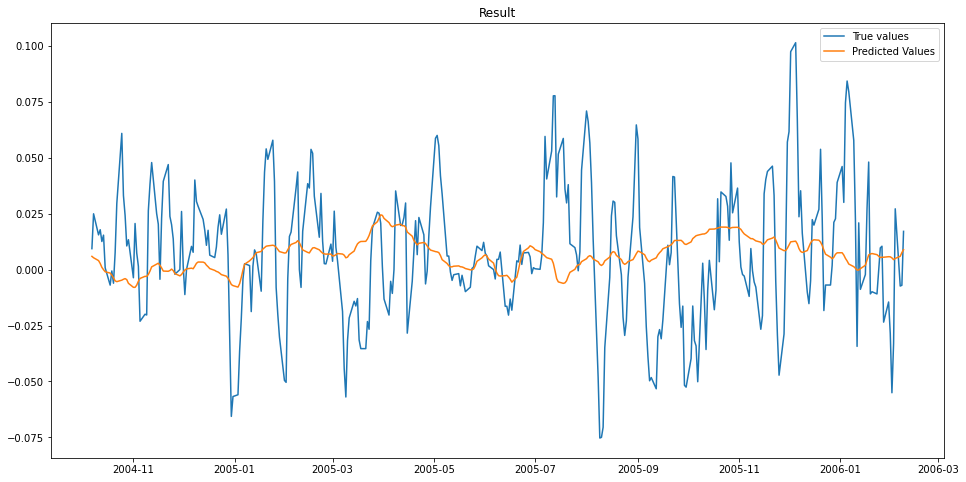


MSE: 0.0009178036312878108

Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 36.2356
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 2 started. Evaluating function at random point.

learning rate: 0.003918194347141745
num_input_nodes: 51
dropout: 0.19492275006819237
sequence_length : 160
batch_size: 112



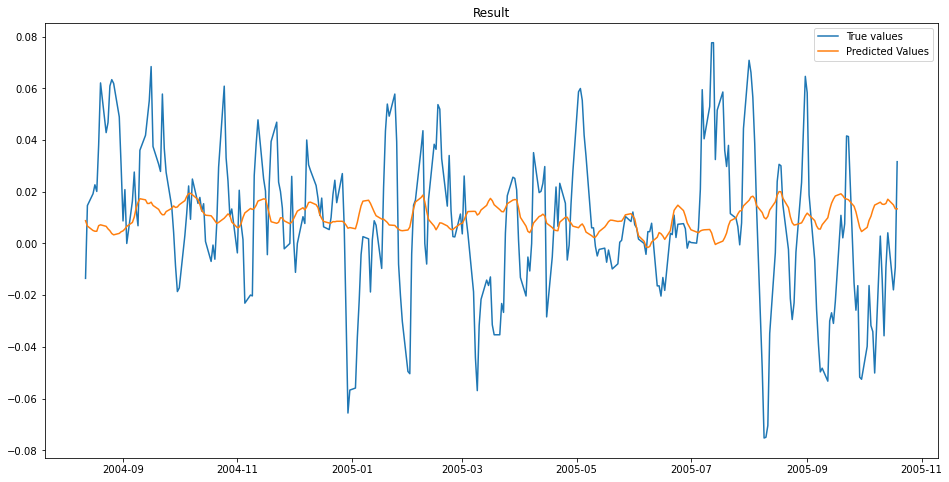


MSE: 0.0008625971500743933

Iteration No: 2 ended. Evaluation done at random point.
Time taken: 10.8282
Function value obtained: 0.0009
Current minimum: 0.0009
Iteration No: 3 started. Evaluating function at random point.

learning rate: 0.00015847101210439096
num_input_nodes: 120
dropout: 0.08342715278475547
sequence_length : 114
batch_size: 163



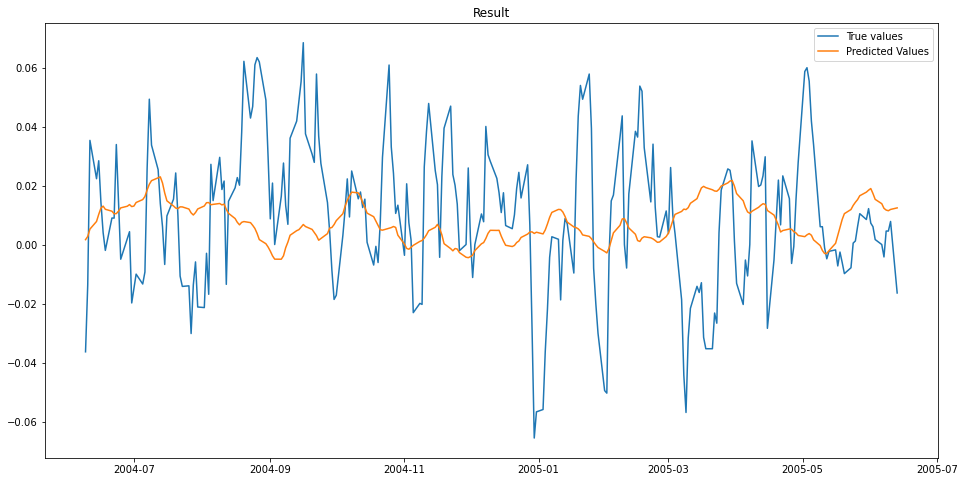


MSE: 0.0006980857297842283

Iteration No: 3 ended. Evaluation done at random point.
Time taken: 11.8037
Function value obtained: 0.0007
Current minimum: 0.0007
Iteration No: 4 started. Evaluating function at random point.

learning rate: 0.00012966511753760403
num_input_nodes: 186
dropout: 0.2346381772539376
sequence_length : 100
batch_size: 248



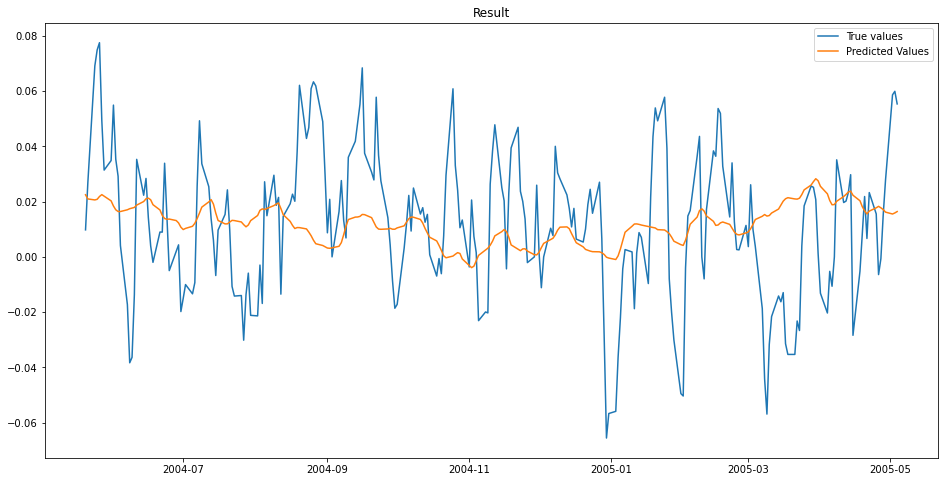


MSE: 0.0007116209056483731

Iteration No: 4 ended. Evaluation done at random point.
Time taken: 12.7297
Function value obtained: 0.0007
Current minimum: 0.0007
Iteration No: 5 started. Evaluating function at random point.

learning rate: 0.0017177621112338384
num_input_nodes: 159
dropout: 0.001766576304929352
sequence_length : 102
batch_size: 132



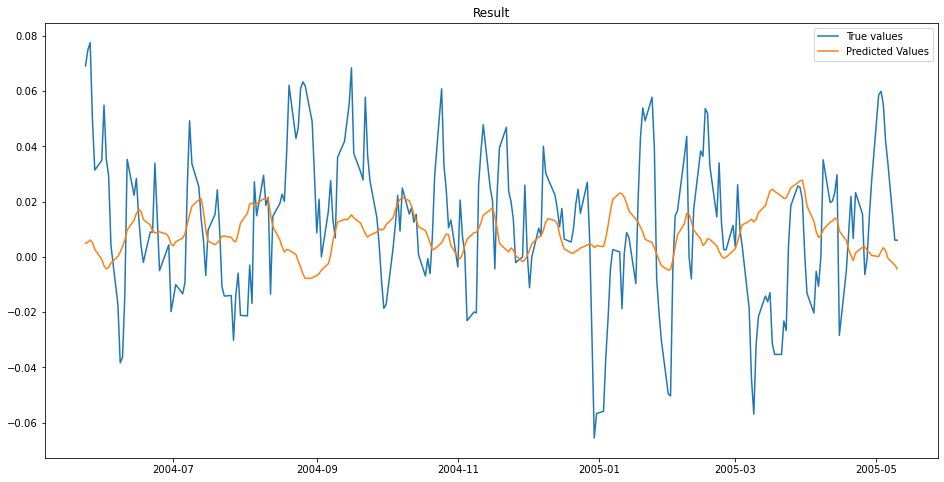


MSE: 0.0008130646942085354

Iteration No: 5 ended. Evaluation done at random point.
Time taken: 11.5288
Function value obtained: 0.0008
Current minimum: 0.0007
Iteration No: 6 started. Evaluating function at random point.

learning rate: 0.0006305535040199287
num_input_nodes: 17
dropout: 0.24343887971036485
sequence_length : 123
batch_size: 24



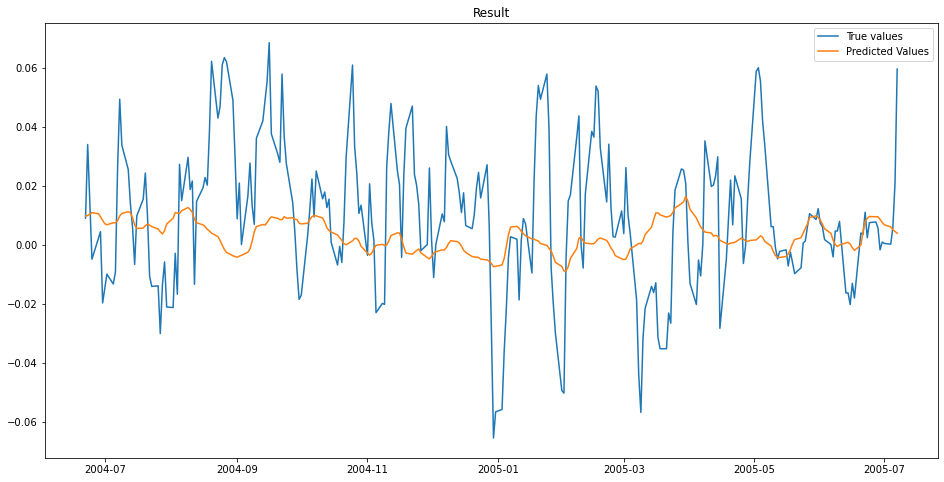


MSE: 0.0006356291164944431

Iteration No: 6 ended. Evaluation done at random point.
Time taken: 17.8003
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 7 started. Evaluating function at random point.

learning rate: 0.0017249321573178998
num_input_nodes: 101
dropout: 0.2458077214516971
sequence_length : 147
batch_size: 215



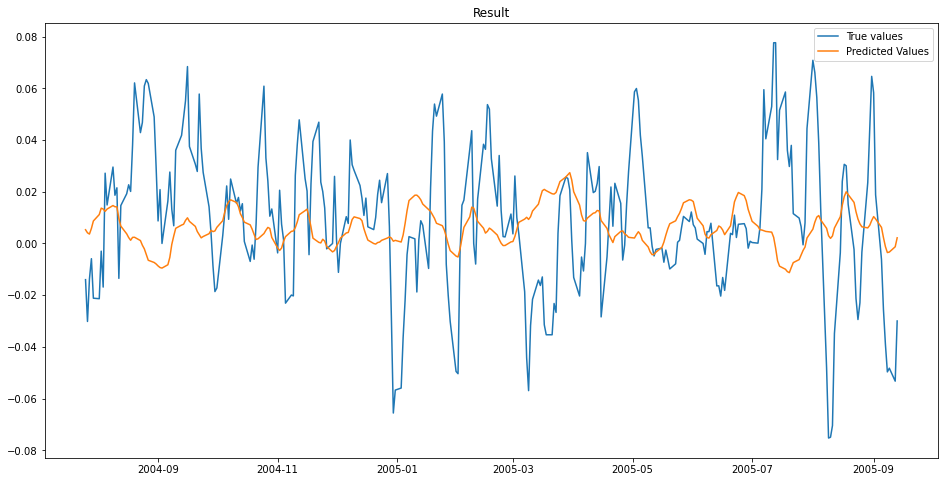


MSE: 0.0008890499231916871

Iteration No: 7 ended. Evaluation done at random point.
Time taken: 11.3942
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 8 started. Evaluating function at random point.

learning rate: 0.0022941144328643983
num_input_nodes: 118
dropout: 0.003316240289966633
sequence_length : 194
batch_size: 141



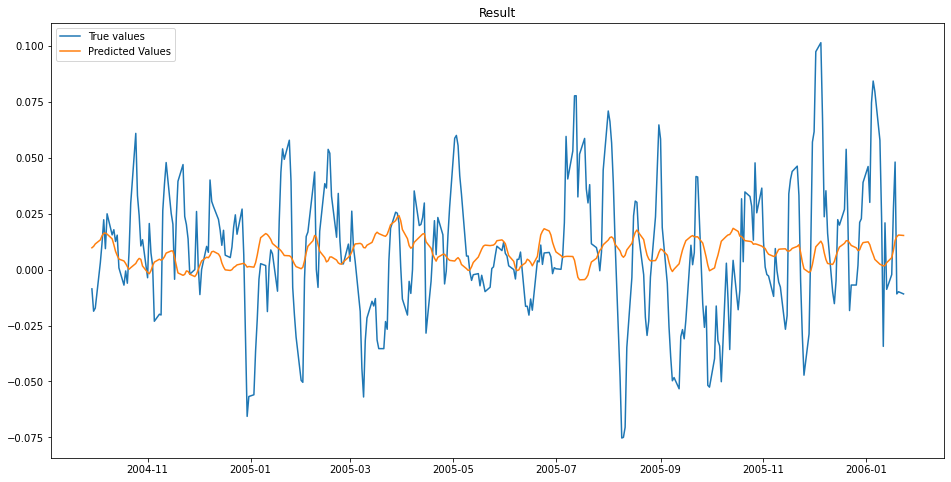


MSE: 0.0008986046591231922

Iteration No: 8 ended. Evaluation done at random point.
Time taken: 14.9103
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 9 started. Evaluating function at random point.

learning rate: 0.0005899741796710488
num_input_nodes: 9
dropout: 0.05772345640553726
sequence_length : 124
batch_size: 171



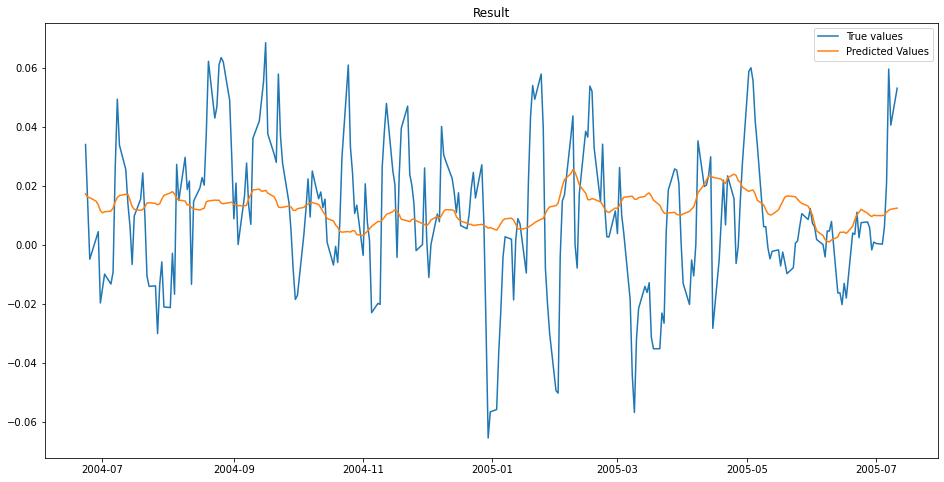


MSE: 0.0005821414763757114

Iteration No: 9 ended. Evaluation done at random point.
Time taken: 9.4098
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 10 started. Evaluating function at random point.

learning rate: 0.0016595613641357258
num_input_nodes: 214
dropout: 0.04334116337694303
sequence_length : 139
batch_size: 46



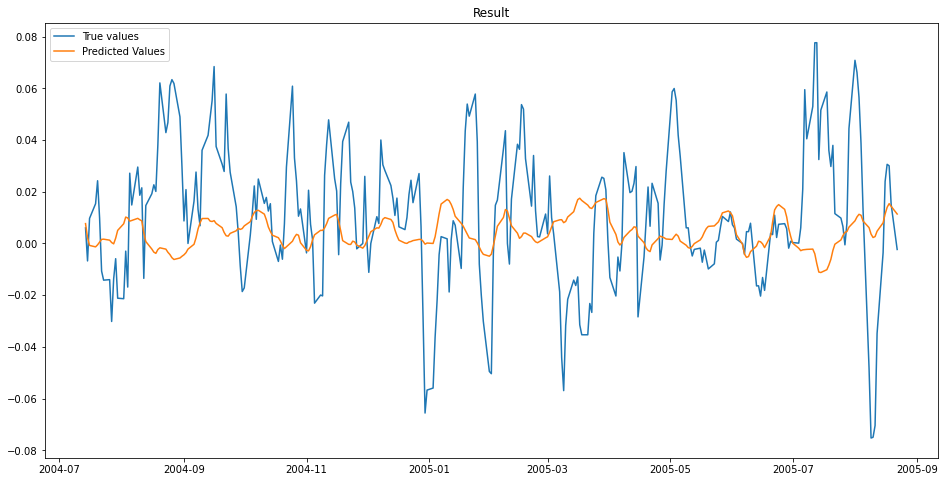


MSE: 0.0008417610305279737

Iteration No: 10 ended. Evaluation done at random point.
Time taken: 20.8334
Function value obtained: 0.0008
Current minimum: 0.0006
Iteration No: 11 started. Evaluating function at random point.

learning rate: 0.0032413268041956303
num_input_nodes: 112
dropout: 0.05198541571704722
sequence_length : 157
batch_size: 9



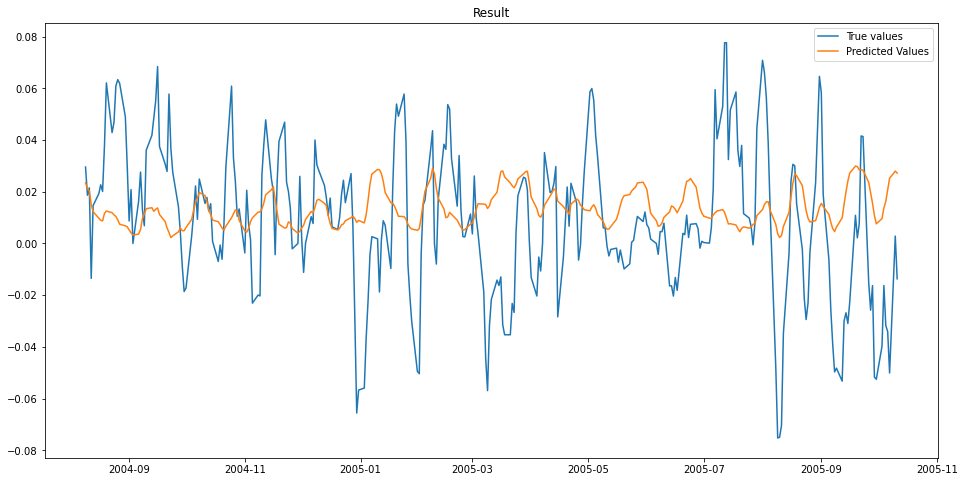


MSE: 0.0009029682012945697

Iteration No: 11 ended. Evaluation done at random point.
Time taken: 52.2489
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 12 started. Evaluating function at random point.

learning rate: 0.004836927180682221
num_input_nodes: 227
dropout: 0.18507824608274567
sequence_length : 163
batch_size: 20



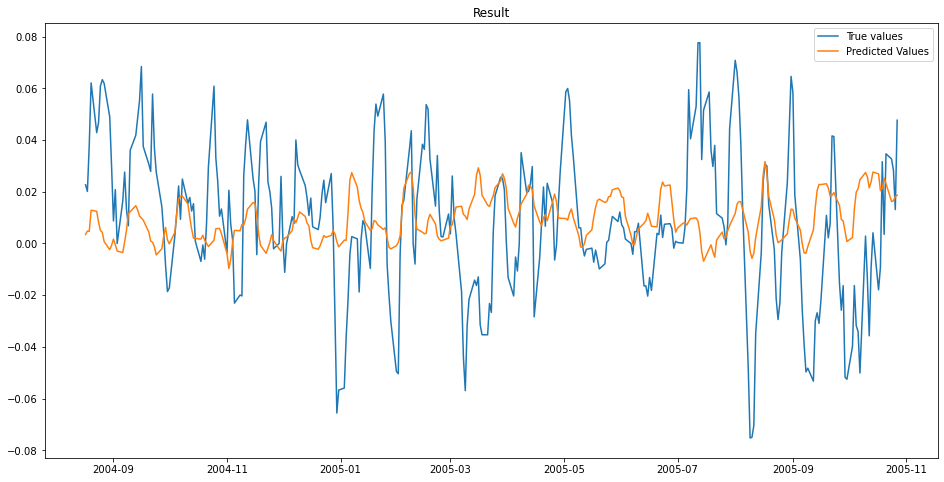


MSE: 0.0008916386221779134

Iteration No: 12 ended. Evaluation done at random point.
Time taken: 38.1418
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 13 started. Searching for the next optimal point.

learning rate: 0.0011055354209093056
num_input_nodes: 247
dropout: 0.23961521562344856
sequence_length : 105
batch_size: 66



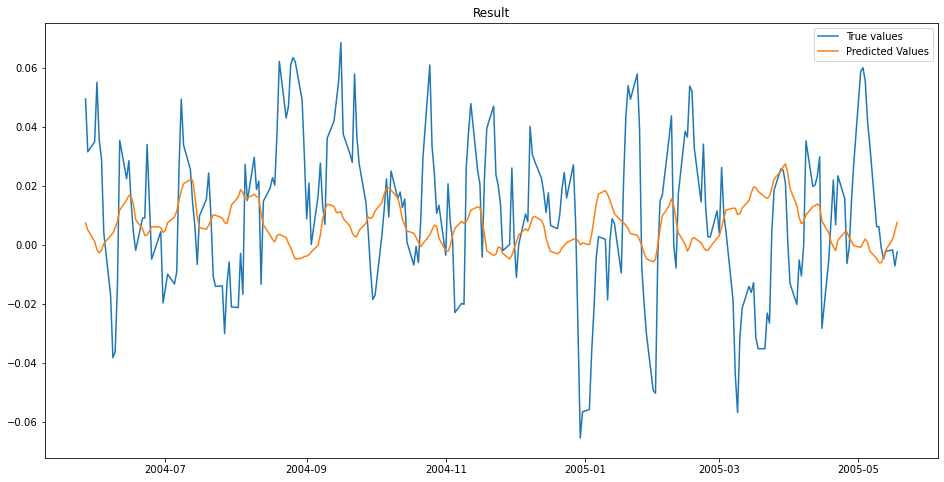


MSE: 0.0007502955779010377

Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 19.6701
Function value obtained: 0.0008
Current minimum: 0.0006
Iteration No: 14 started. Searching for the next optimal point.

learning rate: 0.0002050670804560787
num_input_nodes: 240
dropout: 0.23434029225351388
sequence_length : 141
batch_size: 44



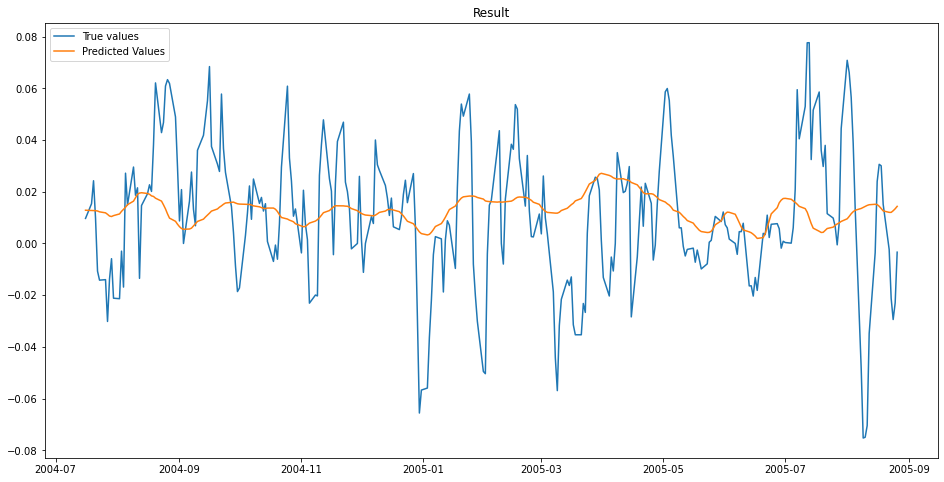


MSE: 0.0007464292834788816

Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 19.9522
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 15 started. Searching for the next optimal point.

learning rate: 0.00010993676976866407
num_input_nodes: 98
dropout: 0.19810399992331712
sequence_length : 151
batch_size: 140



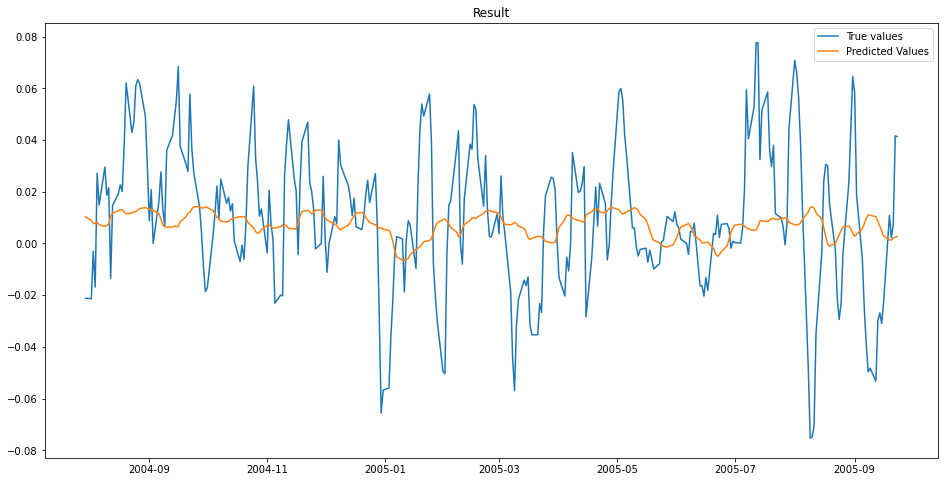


MSE: 0.0008076603904574805

Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 12.2336
Function value obtained: 0.0008
Current minimum: 0.0006
Iteration No: 16 started. Searching for the next optimal point.

learning rate: 0.0001040887456555644
num_input_nodes: 228
dropout: 0.1383620356395441
sequence_length : 150
batch_size: 41



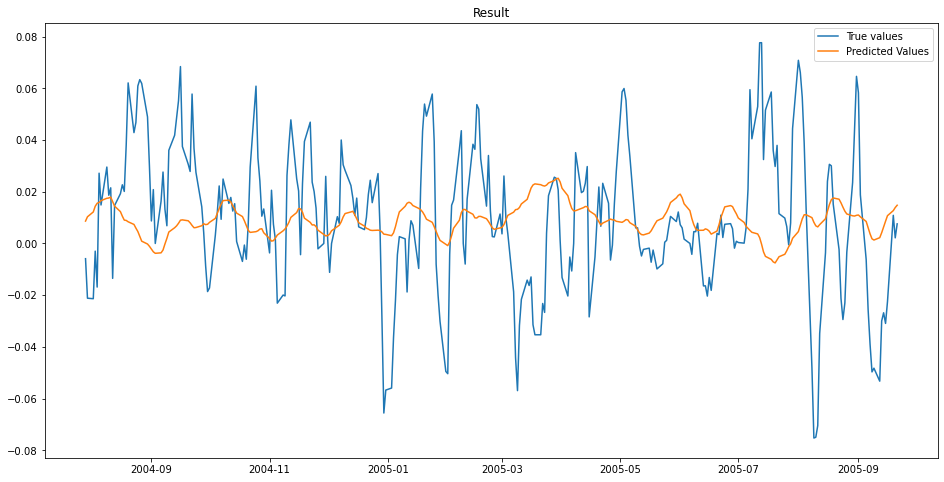


MSE: 0.0008619814720840213

Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 23.7845
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 17 started. Searching for the next optimal point.

learning rate: 0.0028432579235393727
num_input_nodes: 172
dropout: 0.006246422829997629
sequence_length : 198
batch_size: 119



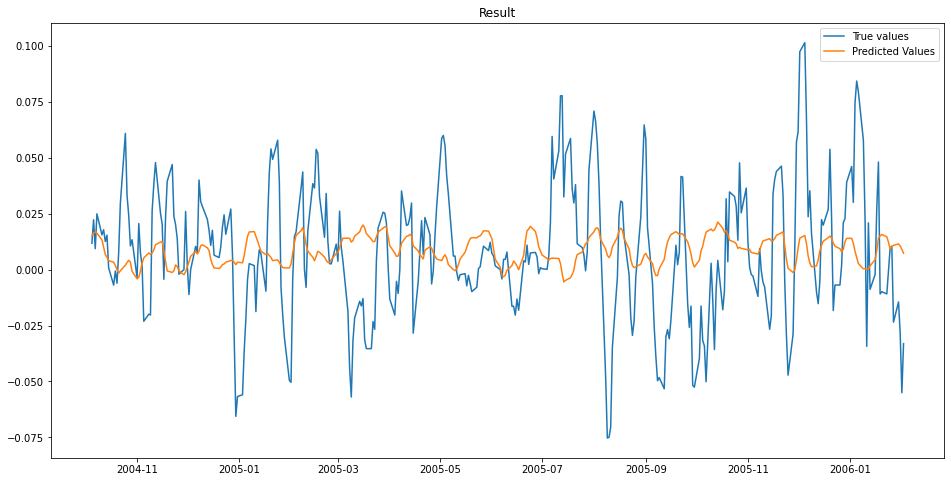


MSE: 0.0009126930690899574

Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 16.6464
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 18 started. Searching for the next optimal point.

learning rate: 0.0003960955242286183
num_input_nodes: 5
dropout: 0.0
sequence_length : 100
batch_size: 214



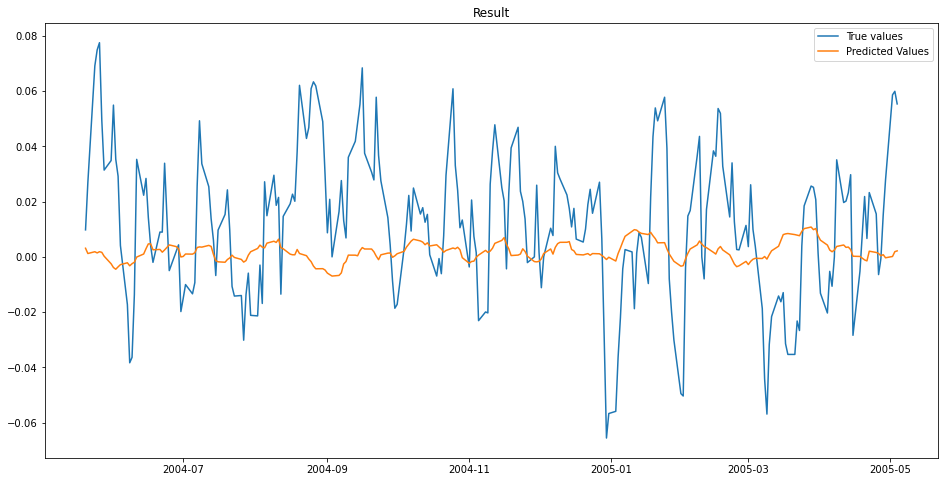


MSE: 0.0007953994885202229

Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 16.6875
Function value obtained: 0.0008
Current minimum: 0.0006
Iteration No: 19 started. Searching for the next optimal point.

learning rate: 0.000738014483906798
num_input_nodes: 248
dropout: 0.0
sequence_length : 100
batch_size: 250



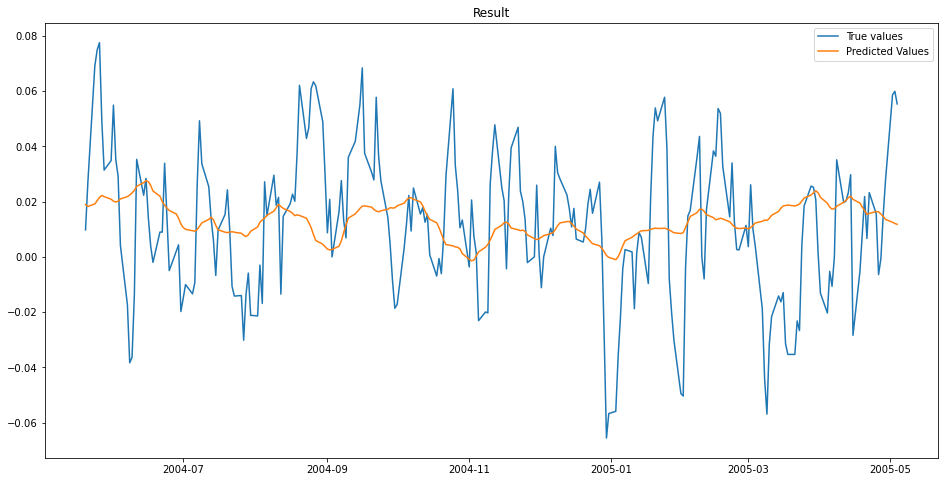


MSE: 0.0006831066396033516

Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 10.0378
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 20 started. Searching for the next optimal point.

learning rate: 0.0005702801427495785
num_input_nodes: 254
dropout: 0.0
sequence_length : 200
batch_size: 166



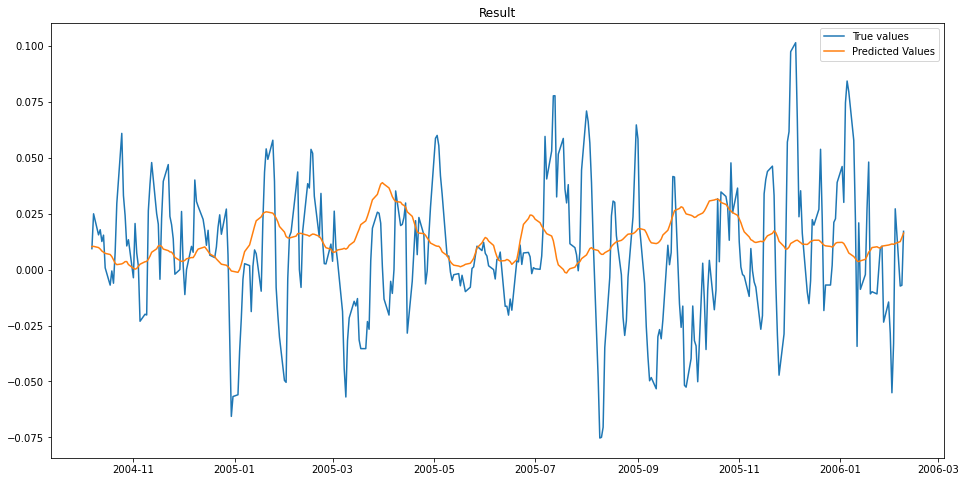


MSE: 0.0009953500980155782

Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 20.6938
Function value obtained: 0.0010
Current minimum: 0.0006
Iteration No: 21 started. Searching for the next optimal point.

learning rate: 0.0004455330057368795
num_input_nodes: 174
dropout: 0.2003688405372928
sequence_length : 124
batch_size: 250



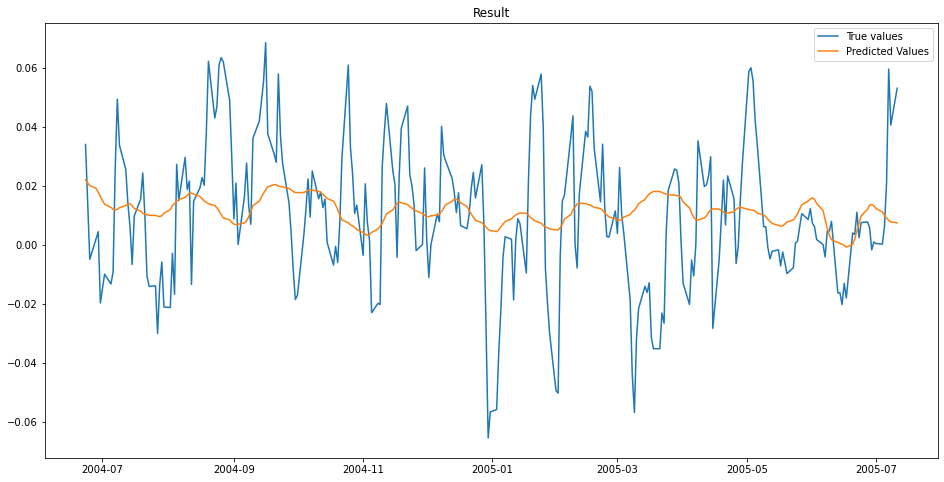


MSE: 0.0005721814271061746

Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 11.5042
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 22 started. Searching for the next optimal point.

learning rate: 0.0003426035409409053
num_input_nodes: 5
dropout: 0.12424187006420538
sequence_length : 130
batch_size: 250



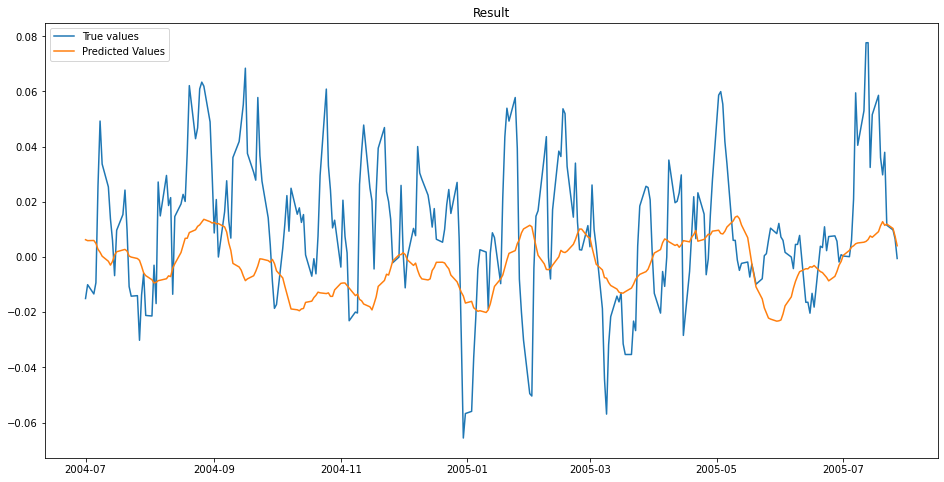


MSE: 0.000789995568603997

Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 9.1723
Function value obtained: 0.0008
Current minimum: 0.0006
Iteration No: 23 started. Searching for the next optimal point.

learning rate: 0.0008702141964891654
num_input_nodes: 114
dropout: 0.21218122653025484
sequence_length : 123
batch_size: 245



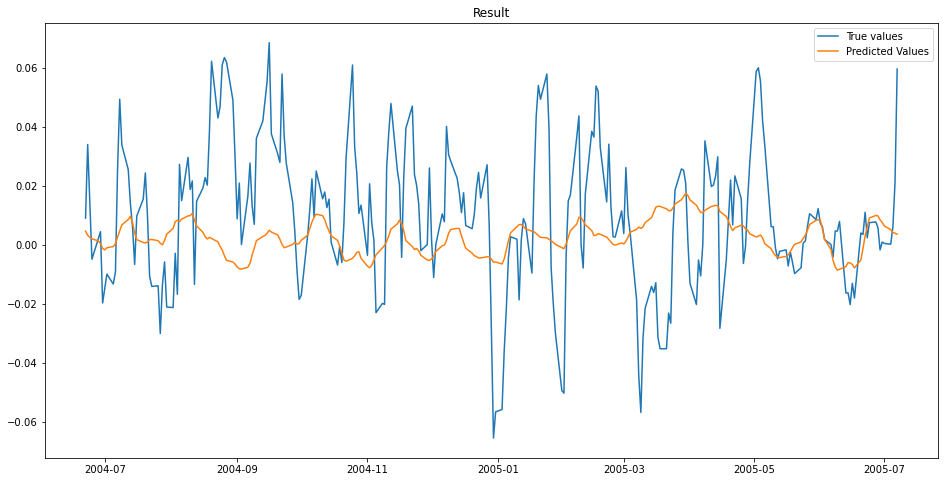


MSE: 0.0006560304174595157

Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 11.1523
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 24 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 256
dropout: 0.026002856512709473
sequence_length : 120
batch_size: 22



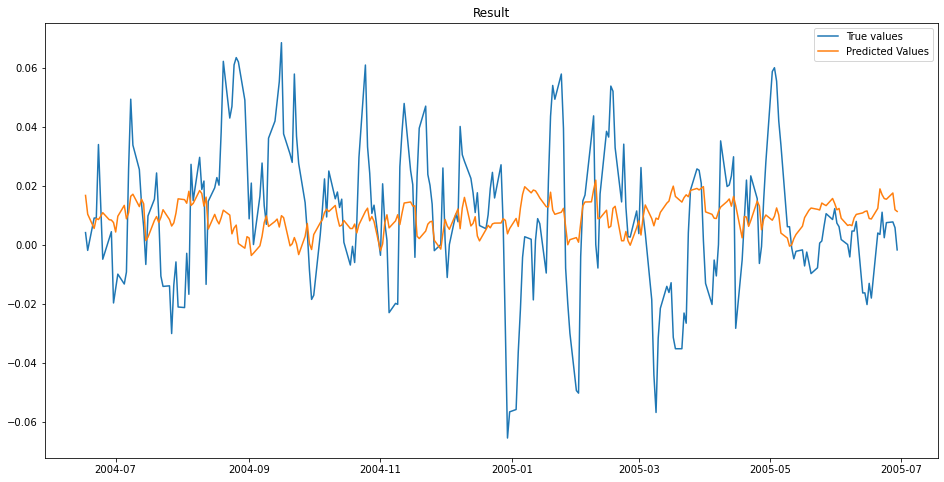


MSE: 0.0006112199869405007

Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 31.1986
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 25 started. Searching for the next optimal point.

learning rate: 0.0002858844098343165
num_input_nodes: 124
dropout: 0.19871927528155914
sequence_length : 112
batch_size: 17



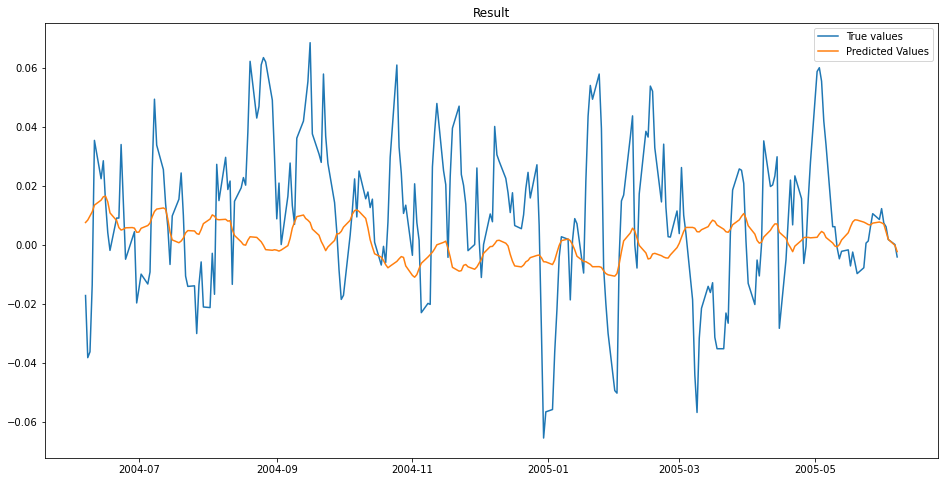


MSE: 0.0007143192184005112

Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 25.4087
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 26 started. Searching for the next optimal point.

learning rate: 0.00015023983842519086
num_input_nodes: 256
dropout: 0.07046484074804253
sequence_length : 121
batch_size: 77



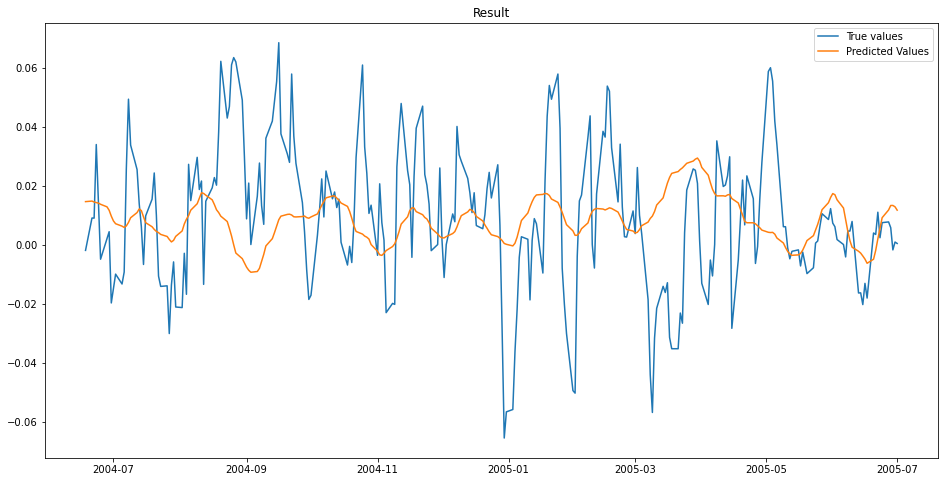


MSE: 0.0006266011915492879

Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 15.9999
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 27 started. Searching for the next optimal point.

learning rate: 0.00391989751341379
num_input_nodes: 67
dropout: 0.22209883733973426
sequence_length : 161
batch_size: 144



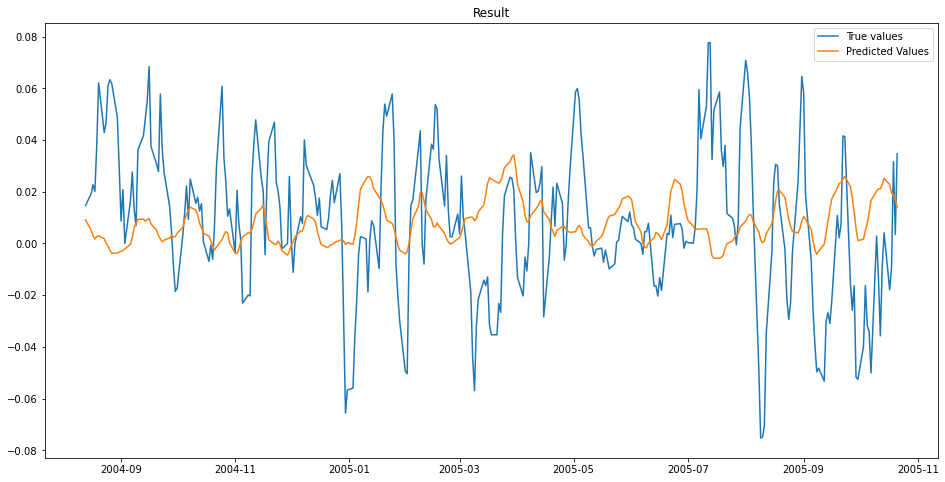


MSE: 0.0009283097886981584

Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 11.7901
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 28 started. Searching for the next optimal point.

learning rate: 0.0022506529857244336
num_input_nodes: 161
dropout: 0.08522162464234627
sequence_length : 155
batch_size: 198



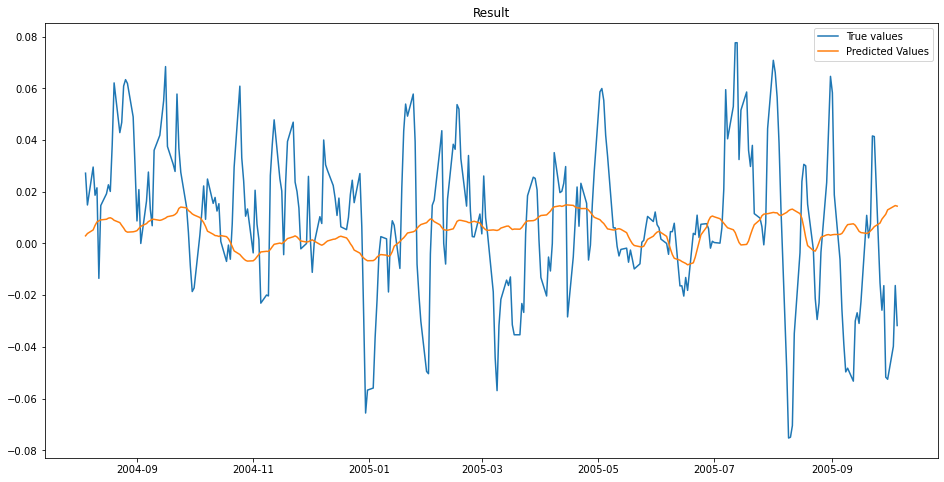


MSE: 0.0008559010266965161

Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 12.9446
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 29 started. Searching for the next optimal point.

learning rate: 0.00043407796537720076
num_input_nodes: 207
dropout: 0.05111844448881574
sequence_length : 187
batch_size: 195



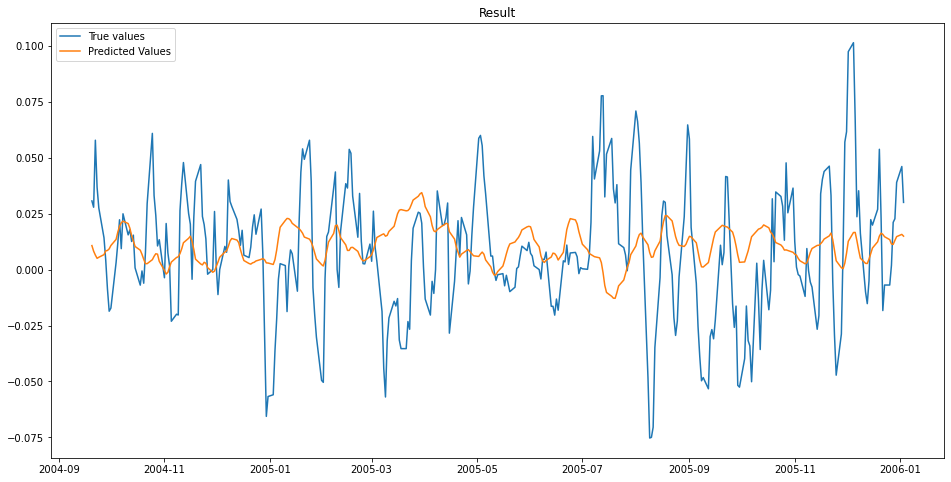


MSE: 0.0009135157063374742

Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 18.0775
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 30 started. Searching for the next optimal point.

learning rate: 0.0020071857054210717
num_input_nodes: 53
dropout: 0.15903945320548288
sequence_length : 110
batch_size: 151



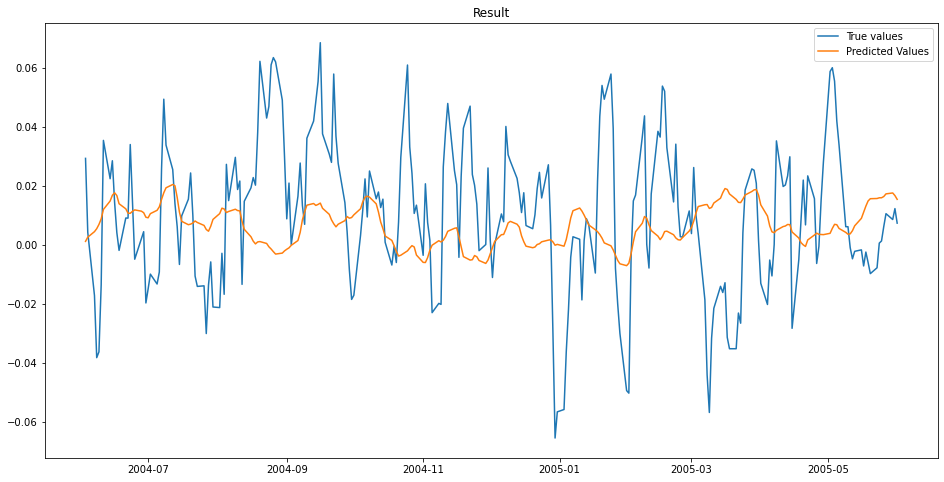


MSE: 0.0007010347828543189

Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 10.3277
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 31 started. Searching for the next optimal point.

learning rate: 0.0017560590100163395
num_input_nodes: 197
dropout: 0.1088747643186341
sequence_length : 121
batch_size: 65



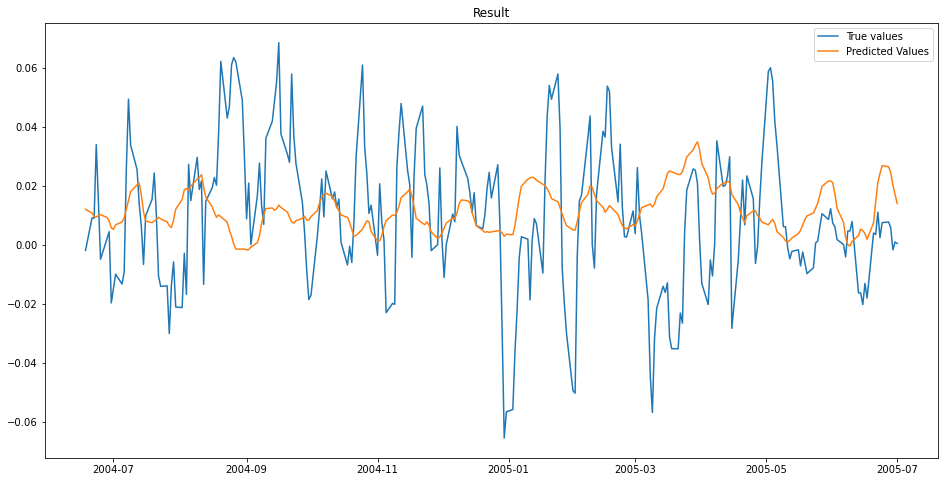


MSE: 0.0006394068447098305

Iteration No: 31 ended. Search finished for the next optimal point.
Time taken: 17.7382
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 32 started. Searching for the next optimal point.

learning rate: 0.0008633902007401385
num_input_nodes: 127
dropout: 0.008028454523932834
sequence_length : 176
batch_size: 126



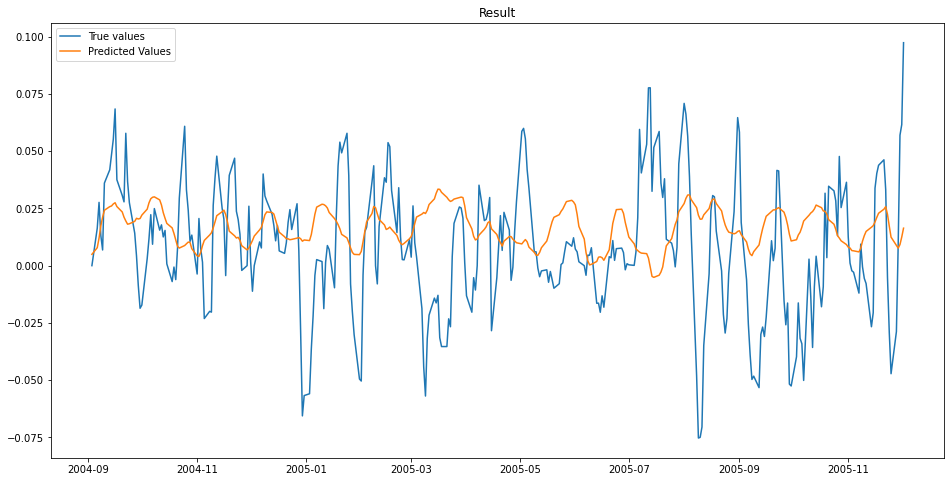


MSE: 0.0009798821127568742

Iteration No: 32 ended. Search finished for the next optimal point.
Time taken: 14.3684
Function value obtained: 0.0010
Current minimum: 0.0006
Iteration No: 33 started. Searching for the next optimal point.

learning rate: 0.0003125732810502738
num_input_nodes: 52
dropout: 0.11887285405944947
sequence_length : 158
batch_size: 179



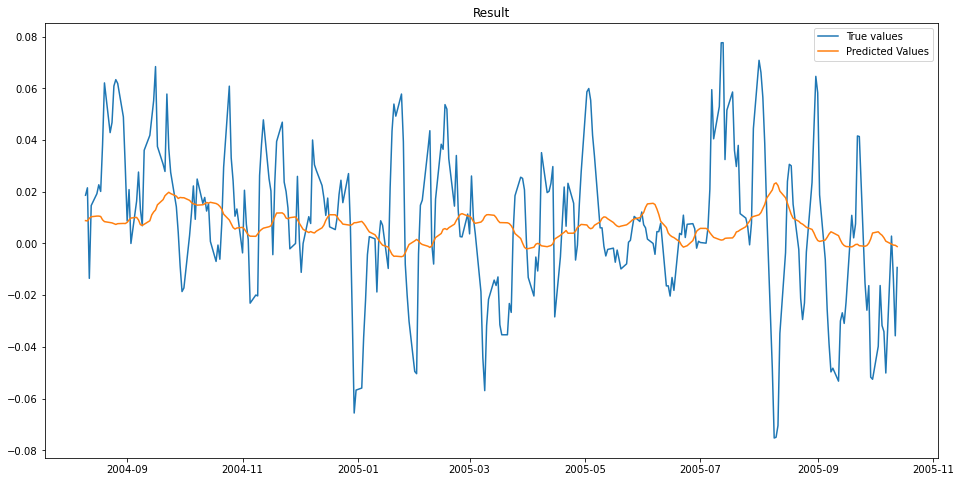


MSE: 0.0008863709746378192

Iteration No: 33 ended. Search finished for the next optimal point.
Time taken: 10.5897
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 34 started. Searching for the next optimal point.

learning rate: 0.00022184183289896374
num_input_nodes: 96
dropout: 0.011921636836763397
sequence_length : 129
batch_size: 205



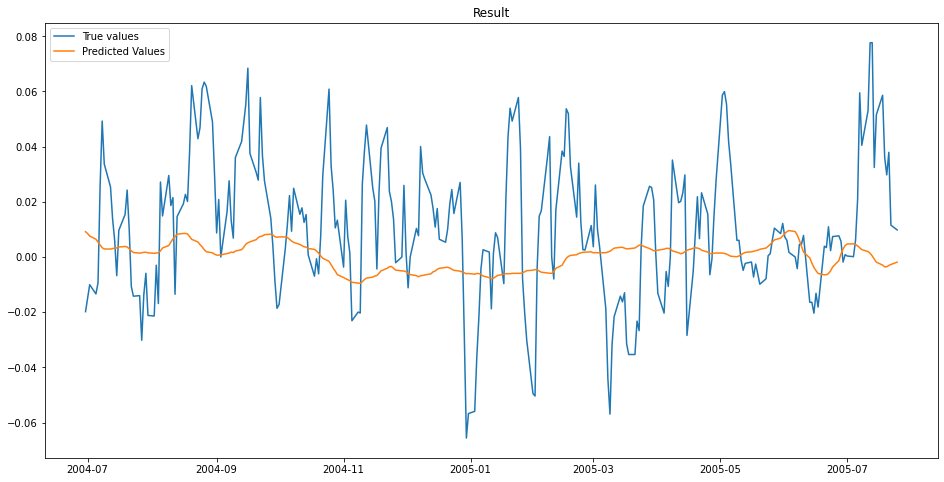


MSE: 0.0007591812339574131

Iteration No: 34 ended. Search finished for the next optimal point.
Time taken: 10.3492
Function value obtained: 0.0008
Current minimum: 0.0006
Iteration No: 35 started. Searching for the next optimal point.

learning rate: 0.005359721675890783
num_input_nodes: 251
dropout: 0.18983783527412793
sequence_length : 120
batch_size: 237



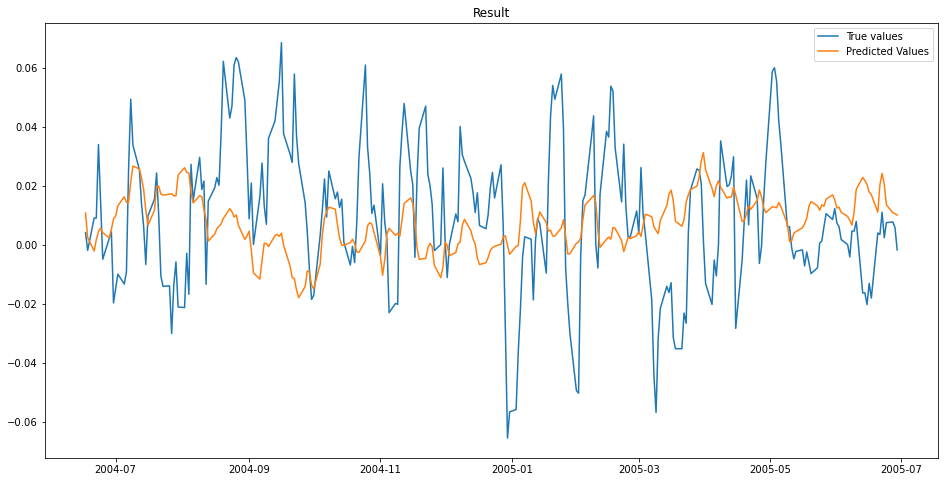


MSE: 0.0006983352551831758

Iteration No: 35 ended. Search finished for the next optimal point.
Time taken: 21.7018
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 36 started. Searching for the next optimal point.

learning rate: 0.00012055082937284856
num_input_nodes: 51
dropout: 0.19274112866403603
sequence_length : 120
batch_size: 23



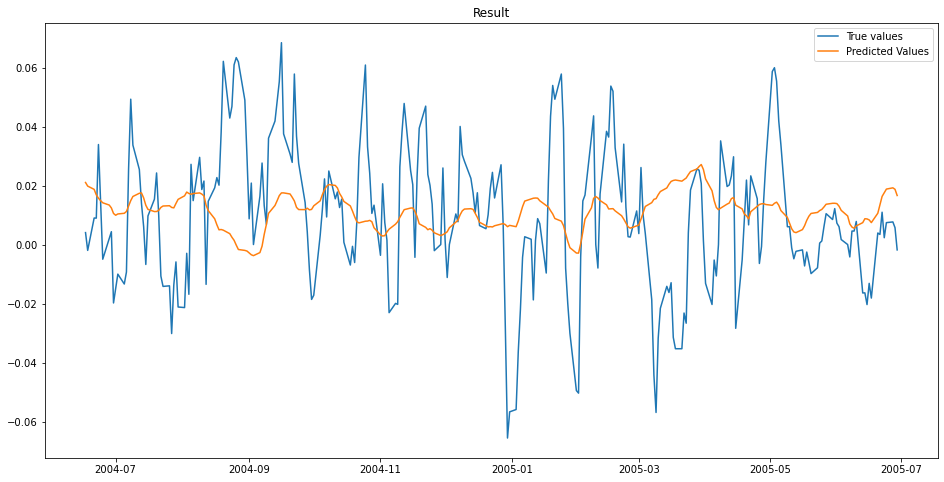


MSE: 0.0006304679096566208

Iteration No: 36 ended. Search finished for the next optimal point.
Time taken: 23.6197
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 37 started. Searching for the next optimal point.

learning rate: 0.00017974063033890595
num_input_nodes: 38
dropout: 0.01643503749865858
sequence_length : 120
batch_size: 15



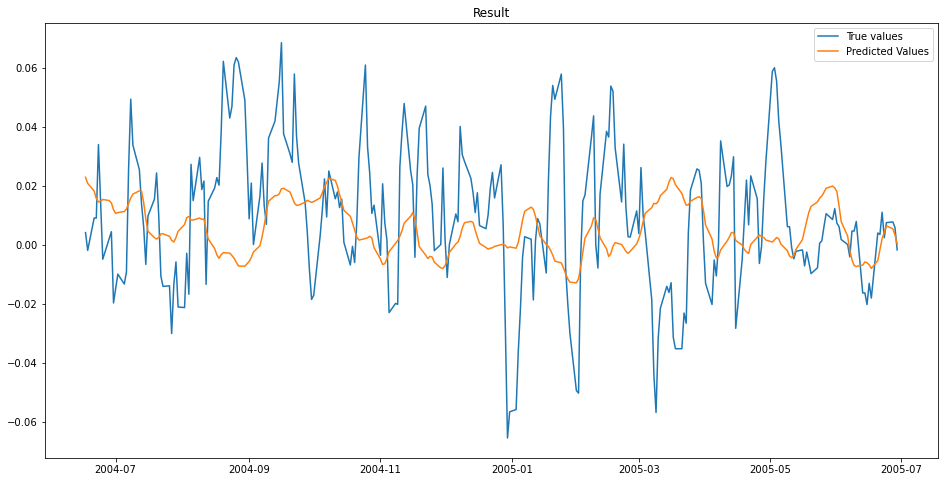


MSE: 0.0006886770537327567

Iteration No: 37 ended. Search finished for the next optimal point.
Time taken: 26.4060
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 38 started. Searching for the next optimal point.

learning rate: 0.001385168775294796
num_input_nodes: 149
dropout: 0.04594948359045937
sequence_length : 114
batch_size: 57



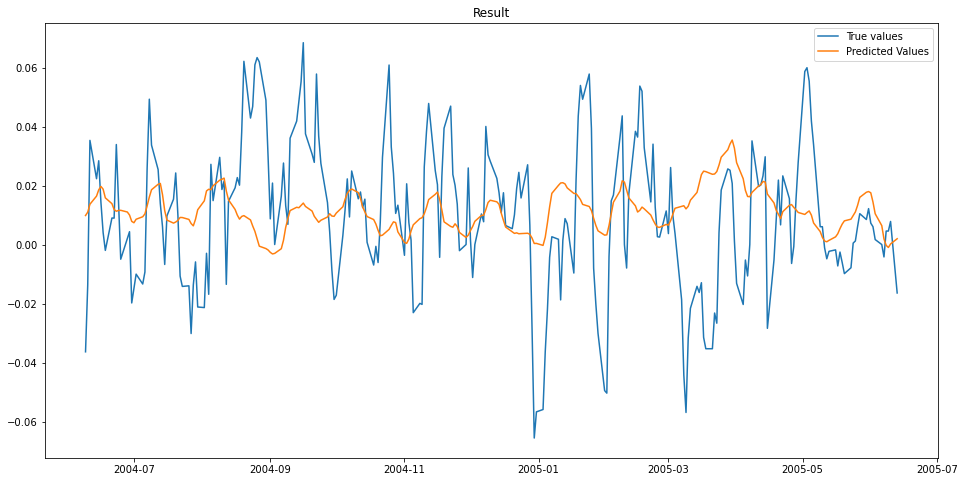


MSE: 0.0006330632165278376

Iteration No: 38 ended. Search finished for the next optimal point.
Time taken: 16.0729
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 39 started. Searching for the next optimal point.

learning rate: 0.008510984339216363
num_input_nodes: 6
dropout: 0.05192338510125548
sequence_length : 118
batch_size: 2



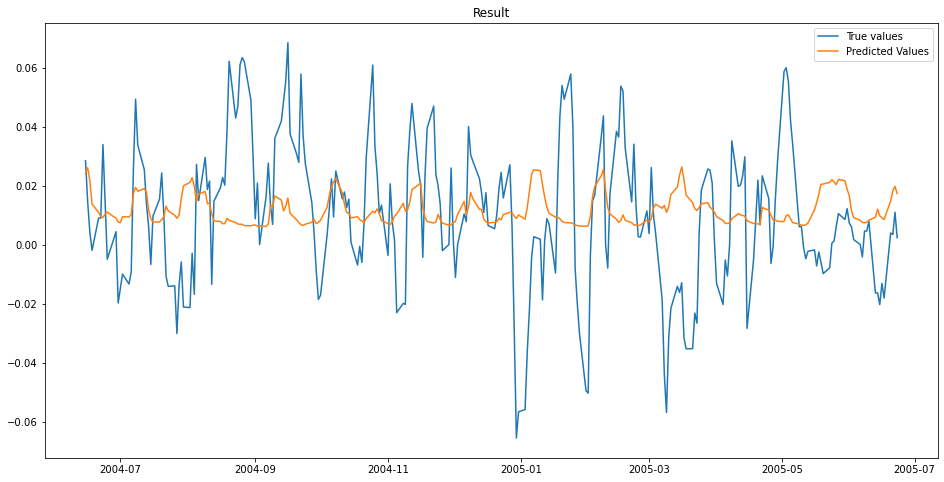


MSE: 0.000632070851009449

Iteration No: 39 ended. Search finished for the next optimal point.
Time taken: 129.9589
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 40 started. Searching for the next optimal point.

learning rate: 0.00025023919664219615
num_input_nodes: 244
dropout: 0.1194401150232195
sequence_length : 114
batch_size: 166



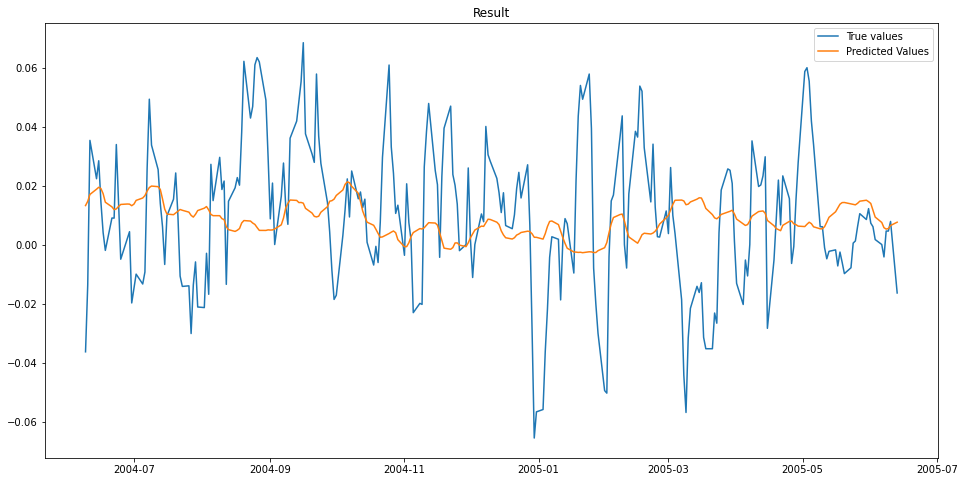


MSE: 0.0006482823764099861

Iteration No: 40 ended. Search finished for the next optimal point.
Time taken: 14.3864
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 41 started. Searching for the next optimal point.

learning rate: 0.0006916911497906814
num_input_nodes: 142
dropout: 0.18595234380023104
sequence_length : 166
batch_size: 109



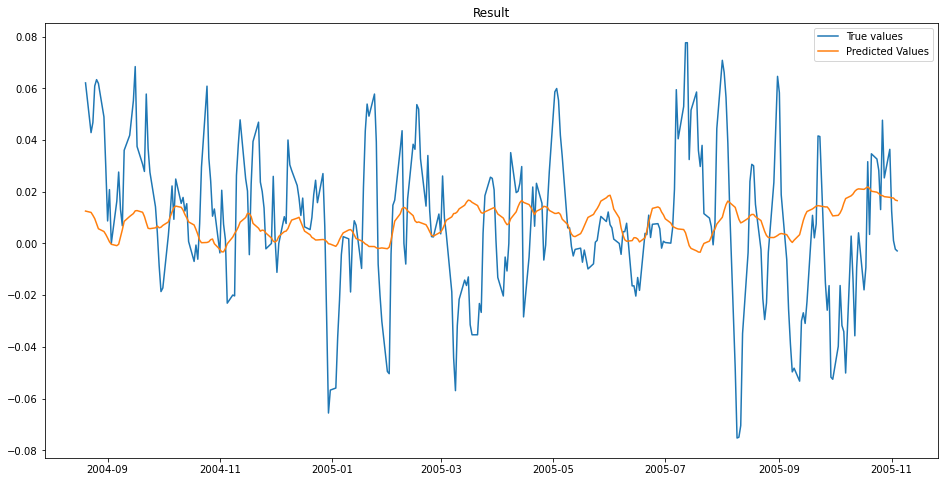


MSE: 0.000868862514964982

Iteration No: 41 ended. Search finished for the next optimal point.
Time taken: 14.3603
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 42 started. Searching for the next optimal point.

learning rate: 0.006257393327206118
num_input_nodes: 86
dropout: 0.12898899378067608
sequence_length : 178
batch_size: 185



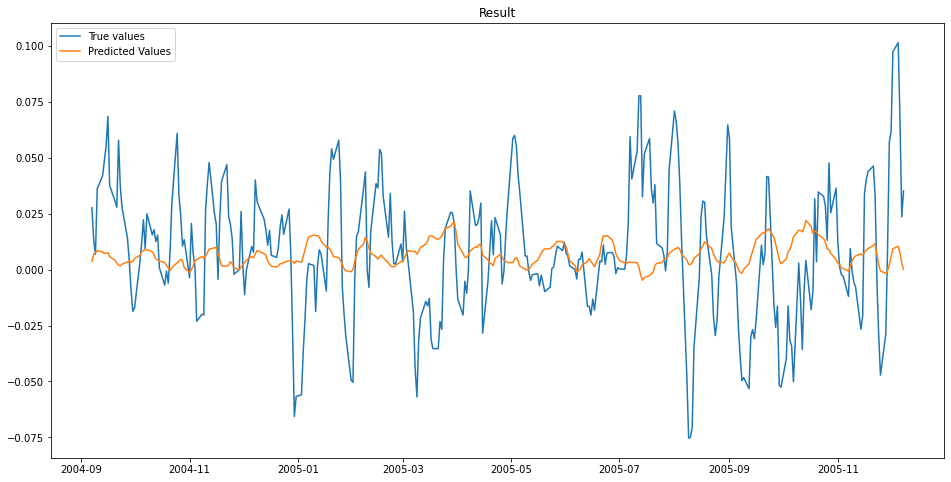


MSE: 0.0008959622127978094

Iteration No: 42 ended. Search finished for the next optimal point.
Time taken: 12.6835
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 43 started. Searching for the next optimal point.

learning rate: 0.002048069043138207
num_input_nodes: 247
dropout: 0.2202737265913907
sequence_length : 120
batch_size: 249



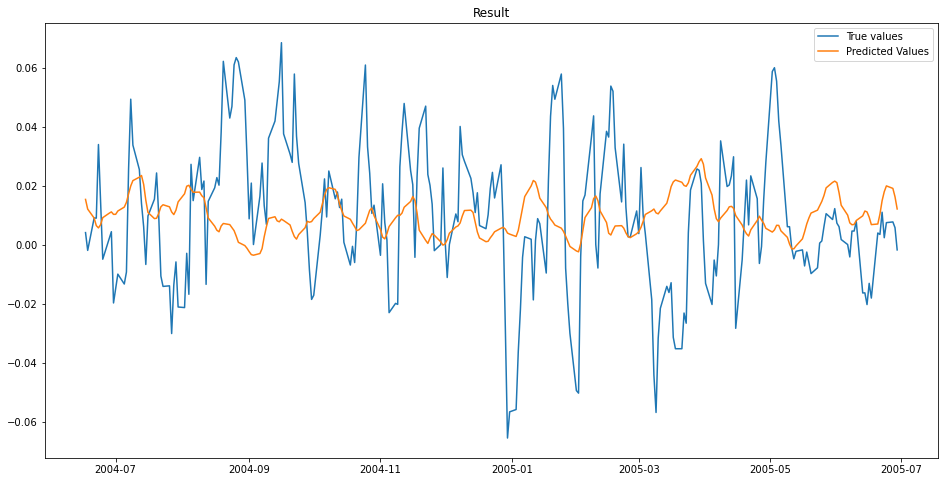


MSE: 0.0006607336886490492

Iteration No: 43 ended. Search finished for the next optimal point.
Time taken: 21.7573
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 44 started. Searching for the next optimal point.

learning rate: 0.00015999394011370437
num_input_nodes: 181
dropout: 0.08604513919744848
sequence_length : 110
batch_size: 34



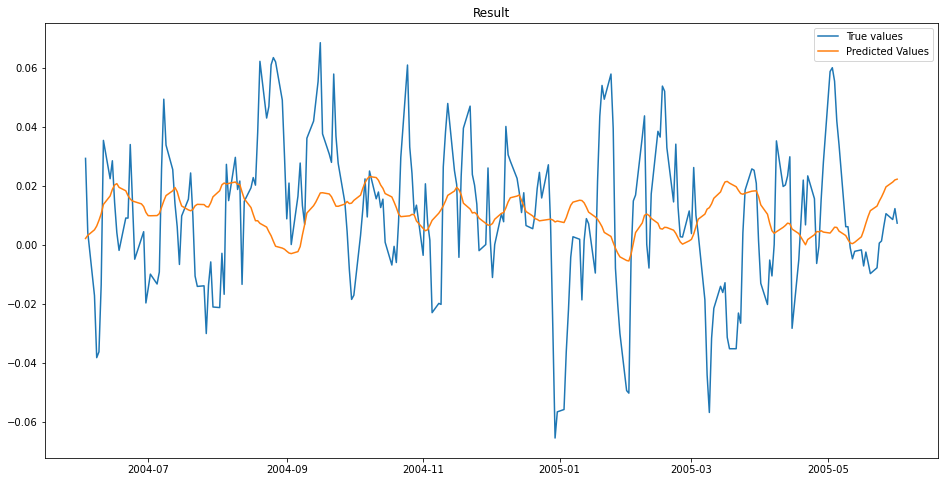


MSE: 0.0006732570134239397

Iteration No: 44 ended. Search finished for the next optimal point.
Time taken: 20.8320
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 45 started. Searching for the next optimal point.

learning rate: 0.002576050711952346
num_input_nodes: 217
dropout: 0.18008333534734158
sequence_length : 187
batch_size: 33



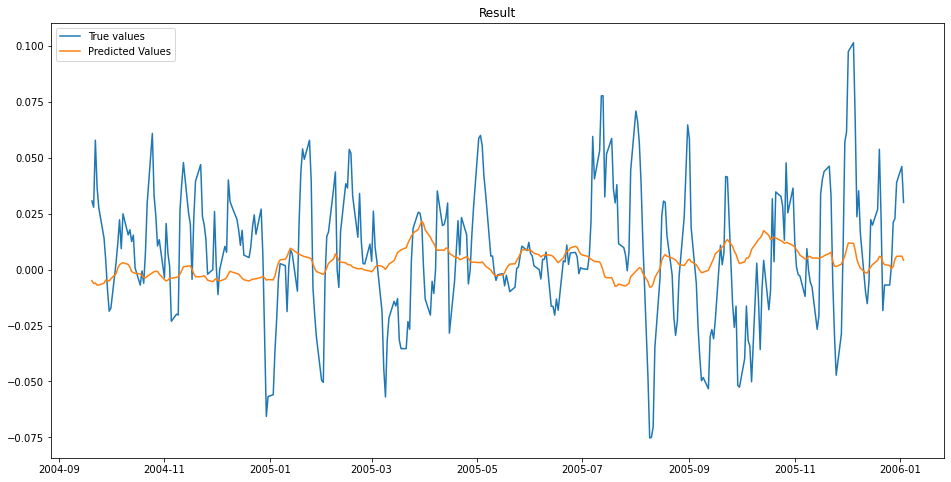


MSE: 0.0008719960413536671

Iteration No: 45 ended. Search finished for the next optimal point.
Time taken: 43.7092
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 46 started. Searching for the next optimal point.

learning rate: 0.0036879818841733195
num_input_nodes: 88
dropout: 0.24555595662566815
sequence_length : 165
batch_size: 41



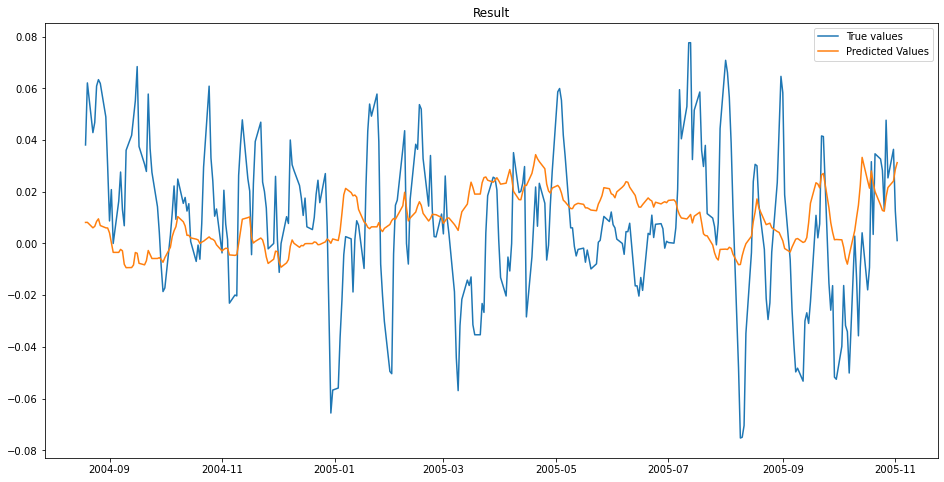


MSE: 0.0009191680898196456

Iteration No: 46 ended. Search finished for the next optimal point.
Time taken: 28.1025
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 47 started. Searching for the next optimal point.

learning rate: 0.00011635407776633327
num_input_nodes: 92
dropout: 0.19701404602314318
sequence_length : 157
batch_size: 26



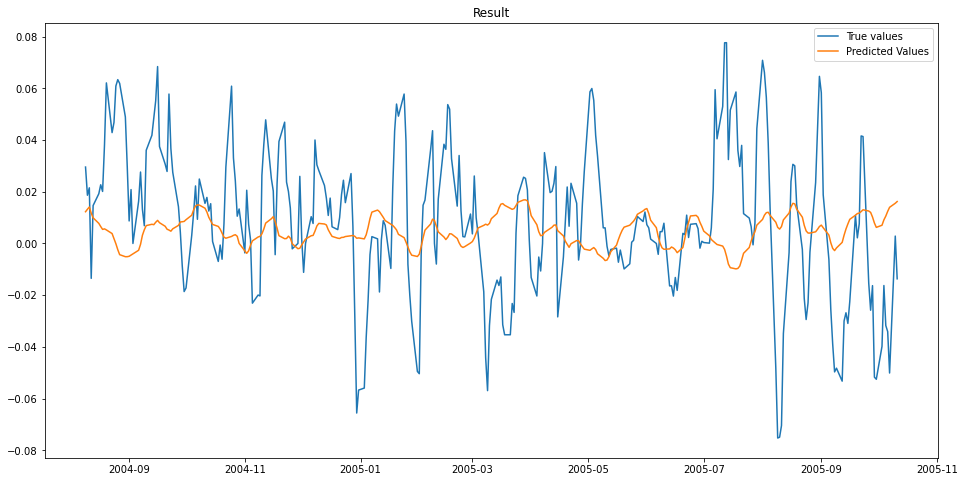


MSE: 0.0009229196363759669

Iteration No: 47 ended. Search finished for the next optimal point.
Time taken: 23.1883
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 48 started. Searching for the next optimal point.

learning rate: 0.00098393071892428
num_input_nodes: 216
dropout: 0.0919402180489166
sequence_length : 168
batch_size: 52



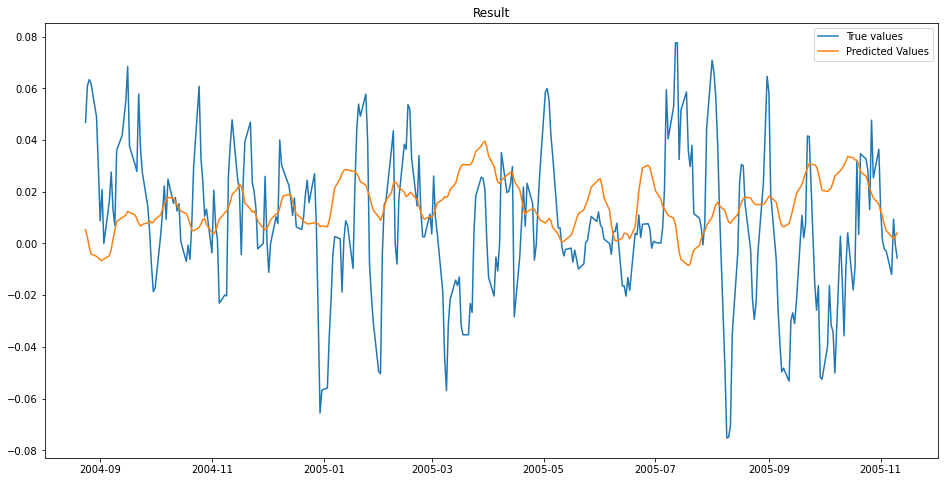


MSE: 0.0010117525058303011

Iteration No: 48 ended. Search finished for the next optimal point.
Time taken: 20.0036
Function value obtained: 0.0010
Current minimum: 0.0006
Iteration No: 49 started. Searching for the next optimal point.

learning rate: 0.008284113975819067
num_input_nodes: 183
dropout: 0.23312106822885134
sequence_length : 120
batch_size: 12



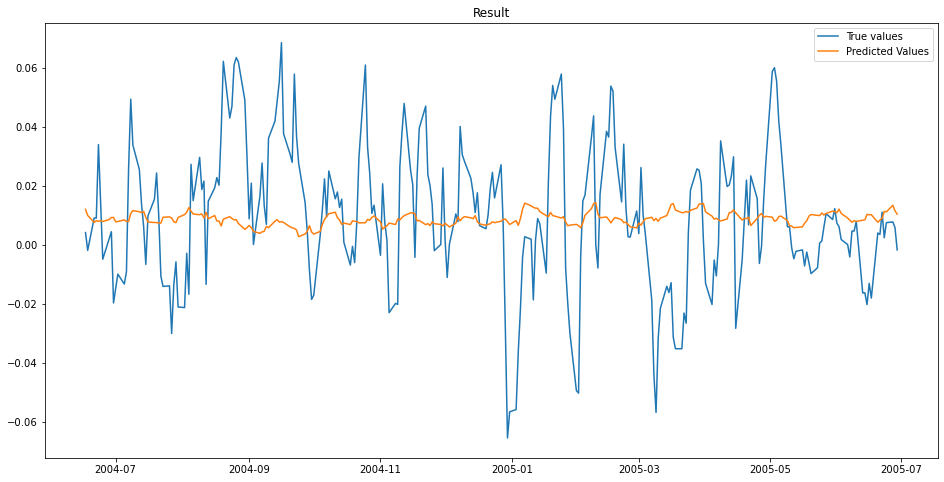


MSE: 0.0005912531998548201

Iteration No: 49 ended. Search finished for the next optimal point.
Time taken: 36.6032
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 50 started. Searching for the next optimal point.

learning rate: 0.0015196648522700794
num_input_nodes: 144
dropout: 0.12923914683506915
sequence_length : 107
batch_size: 181



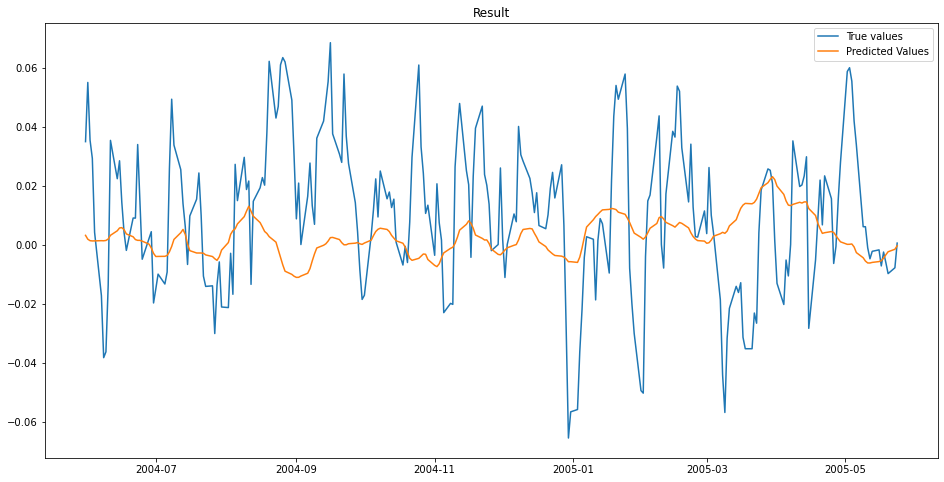


MSE: 0.0007329347368957295

Iteration No: 50 ended. Search finished for the next optimal point.
Time taken: 10.2147
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 51 started. Searching for the next optimal point.

learning rate: 0.00035696221331054826
num_input_nodes: 60
dropout: 0.15871059674378532
sequence_length : 152
batch_size: 205



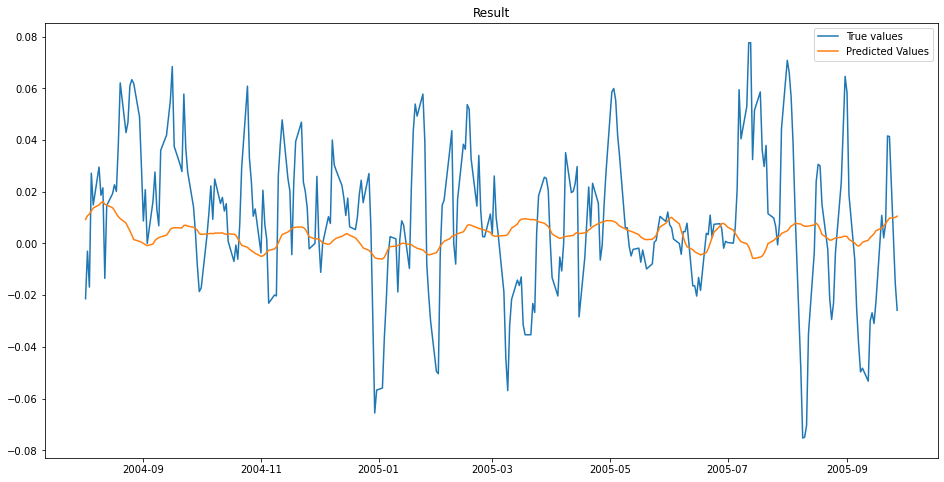


MSE: 0.0008318113123683995

Iteration No: 51 ended. Search finished for the next optimal point.
Time taken: 10.6170
Function value obtained: 0.0008
Current minimum: 0.0006
Iteration No: 52 started. Searching for the next optimal point.

learning rate: 0.0001188409223381412
num_input_nodes: 177
dropout: 0.21891156143998414
sequence_length : 168
batch_size: 175



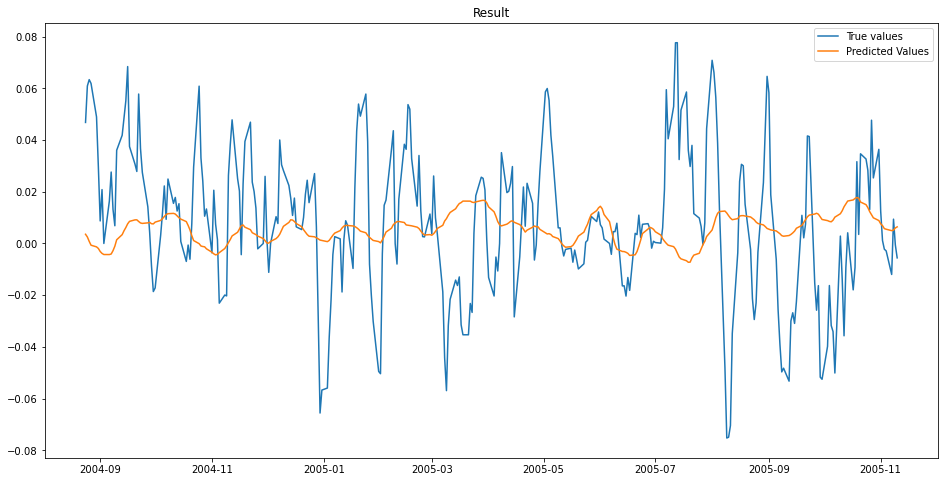


MSE: 0.0008982620346765965

Iteration No: 52 ended. Search finished for the next optimal point.
Time taken: 15.5306
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 53 started. Searching for the next optimal point.

learning rate: 0.0033298625298422277
num_input_nodes: 48
dropout: 0.19978580796758103
sequence_length : 124
batch_size: 174



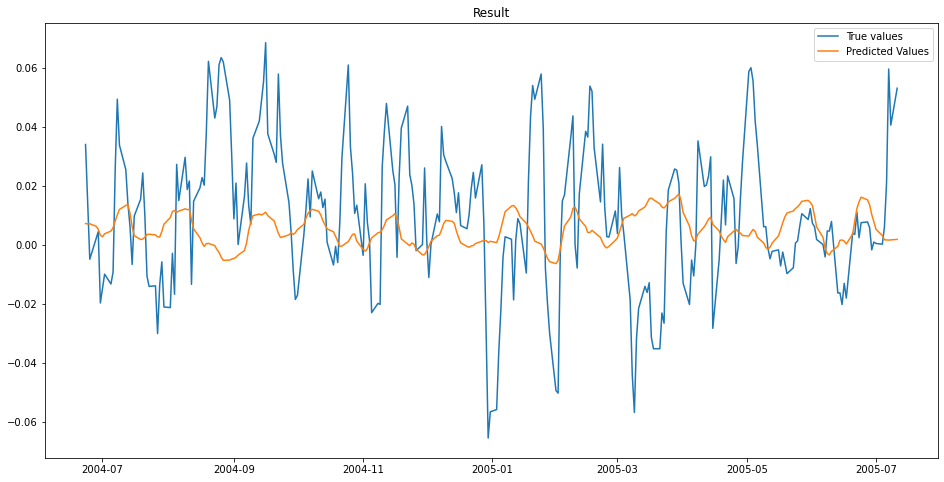


MSE: 0.0006596092423468494

Iteration No: 53 ended. Search finished for the next optimal point.
Time taken: 9.9202
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 54 started. Searching for the next optimal point.

learning rate: 0.00036027060747977226
num_input_nodes: 102
dropout: 0.04395199891507324
sequence_length : 157
batch_size: 103



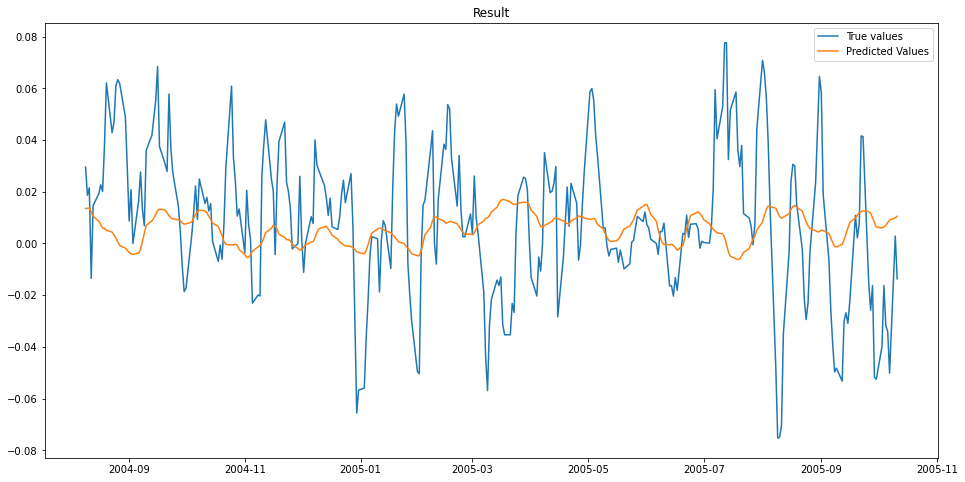


MSE: 0.0008799535070065494

Iteration No: 54 ended. Search finished for the next optimal point.
Time taken: 14.1997
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 55 started. Searching for the next optimal point.

learning rate: 0.0007041754428186566
num_input_nodes: 24
dropout: 0.1808445203832612
sequence_length : 193
batch_size: 13



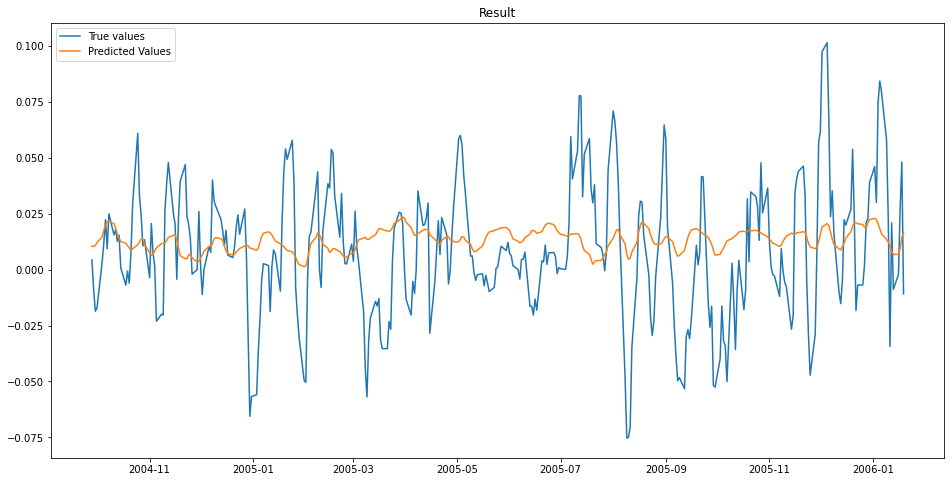


MSE: 0.0008691983228143756

Iteration No: 55 ended. Search finished for the next optimal point.
Time taken: 38.3018
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 56 started. Searching for the next optimal point.

learning rate: 0.009919908572416309
num_input_nodes: 75
dropout: 0.06993407026048219
sequence_length : 116
batch_size: 224



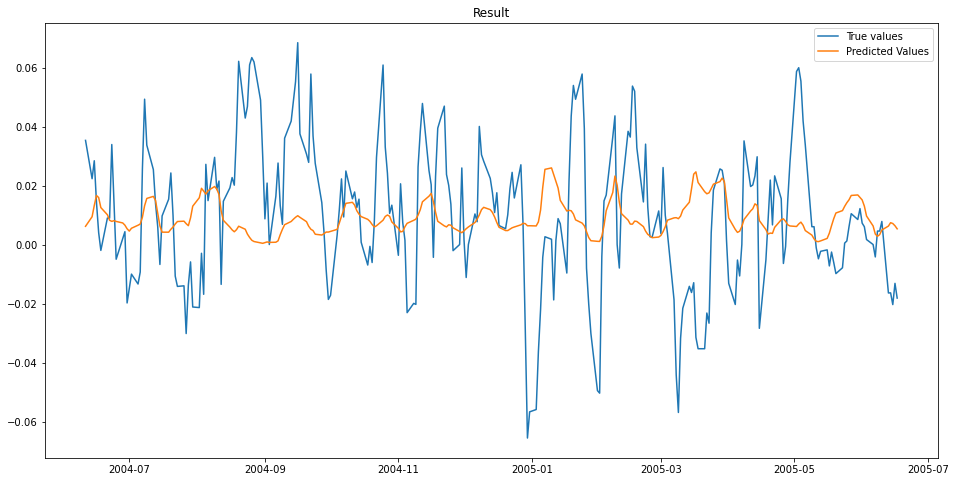


MSE: 0.0006336287379550963

Iteration No: 56 ended. Search finished for the next optimal point.
Time taken: 9.8615
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 57 started. Searching for the next optimal point.

learning rate: 0.0008391219344904093
num_input_nodes: 21
dropout: 0.24902285875852992
sequence_length : 120
batch_size: 194



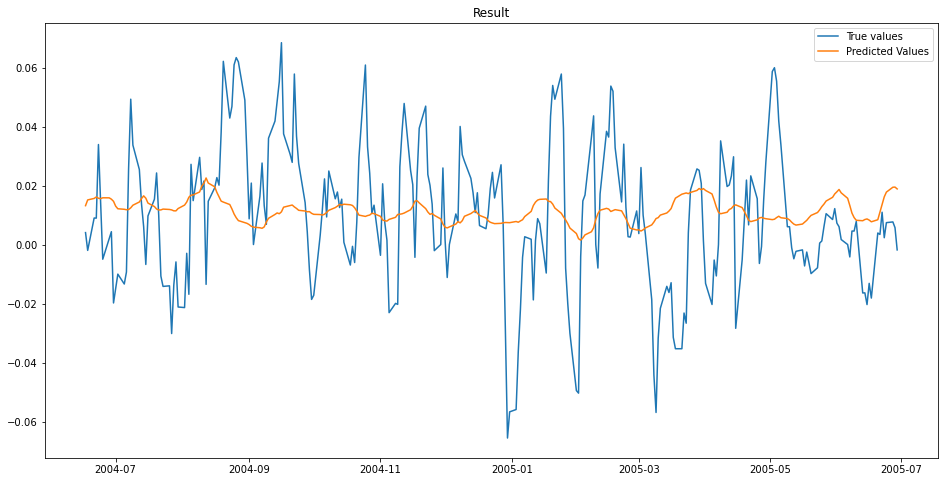


MSE: 0.0005892947310577303

Iteration No: 57 ended. Search finished for the next optimal point.
Time taken: 9.8829
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 58 started. Searching for the next optimal point.

learning rate: 0.0009519885287777707
num_input_nodes: 132
dropout: 0.029560473583090864
sequence_length : 146
batch_size: 176



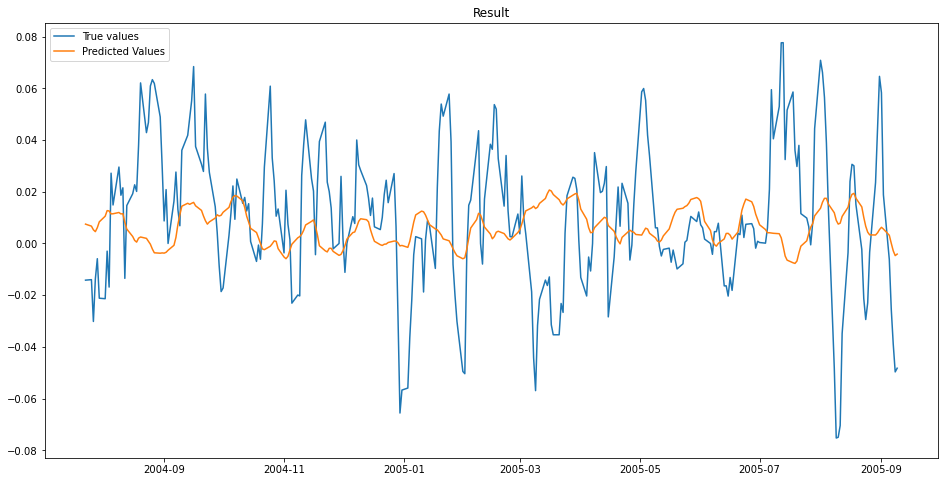


MSE: 0.0008613783960774101

Iteration No: 58 ended. Search finished for the next optimal point.
Time taken: 12.9515
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 59 started. Searching for the next optimal point.

learning rate: 0.007831797808671348
num_input_nodes: 228
dropout: 0.25
sequence_length : 120
batch_size: 133



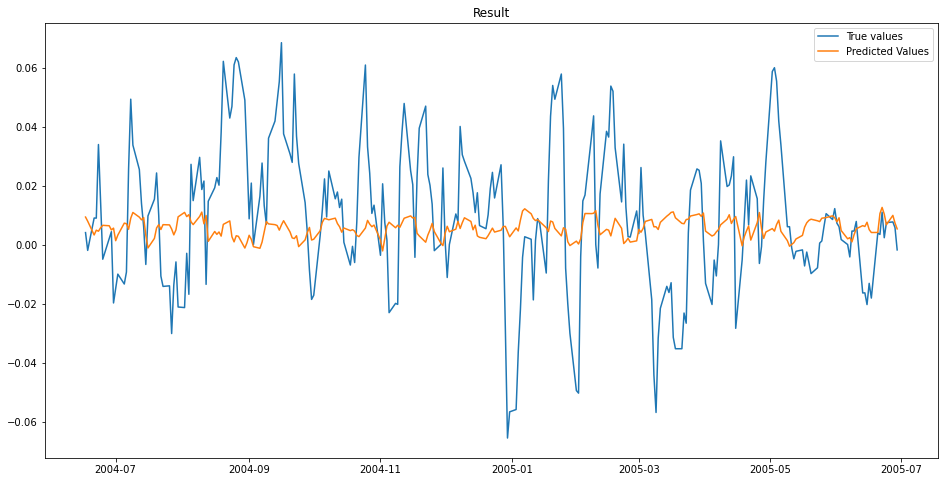


MSE: 0.0006097672033976788

Iteration No: 59 ended. Search finished for the next optimal point.
Time taken: 14.8506
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 60 started. Searching for the next optimal point.

learning rate: 0.00010180274711078338
num_input_nodes: 163
dropout: 0.07920302891584906
sequence_length : 176
batch_size: 158



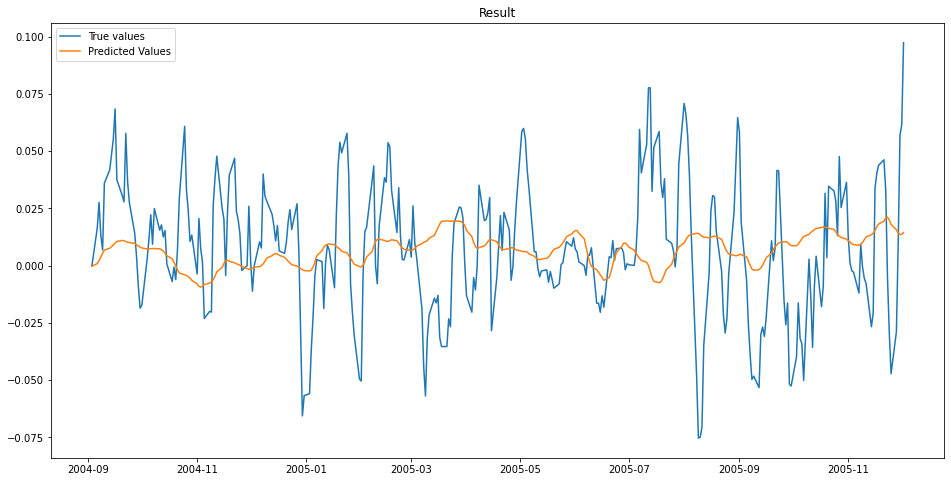


MSE: 0.0008946085400130212

Iteration No: 60 ended. Search finished for the next optimal point.
Time taken: 15.4797
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 61 started. Searching for the next optimal point.

learning rate: 0.004601649422606682
num_input_nodes: 85
dropout: 0.015120516756848643
sequence_length : 148
batch_size: 188



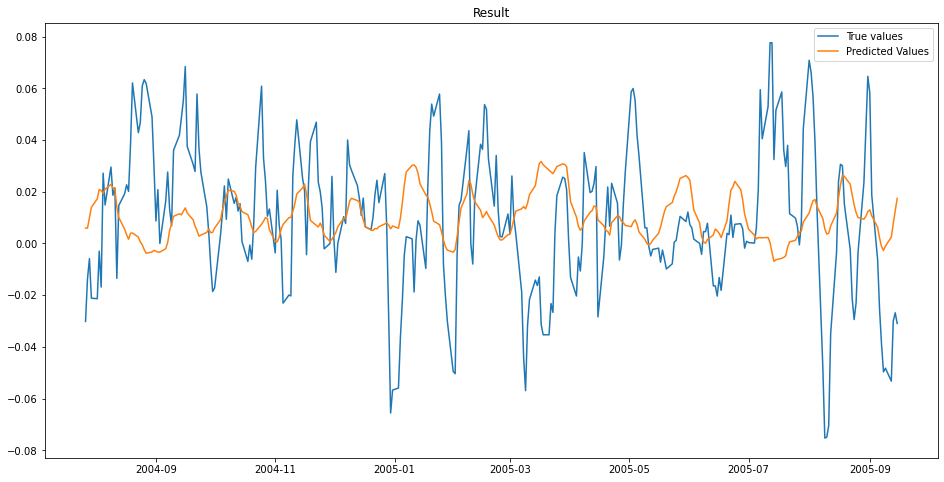


MSE: 0.0009049489795537656

Iteration No: 61 ended. Search finished for the next optimal point.
Time taken: 11.9063
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 62 started. Searching for the next optimal point.

learning rate: 0.003778761170677325
num_input_nodes: 207
dropout: 0.17932400172786384
sequence_length : 169
batch_size: 166



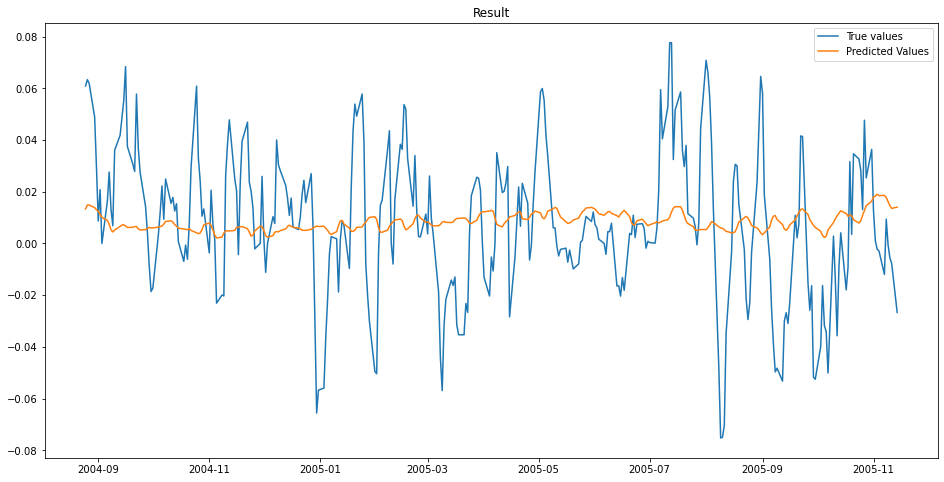


MSE: 0.0008211158578389694

Iteration No: 62 ended. Search finished for the next optimal point.
Time taken: 27.1940
Function value obtained: 0.0008
Current minimum: 0.0006
Iteration No: 63 started. Searching for the next optimal point.

learning rate: 0.00017931368334530553
num_input_nodes: 36
dropout: 0.25
sequence_length : 120
batch_size: 18



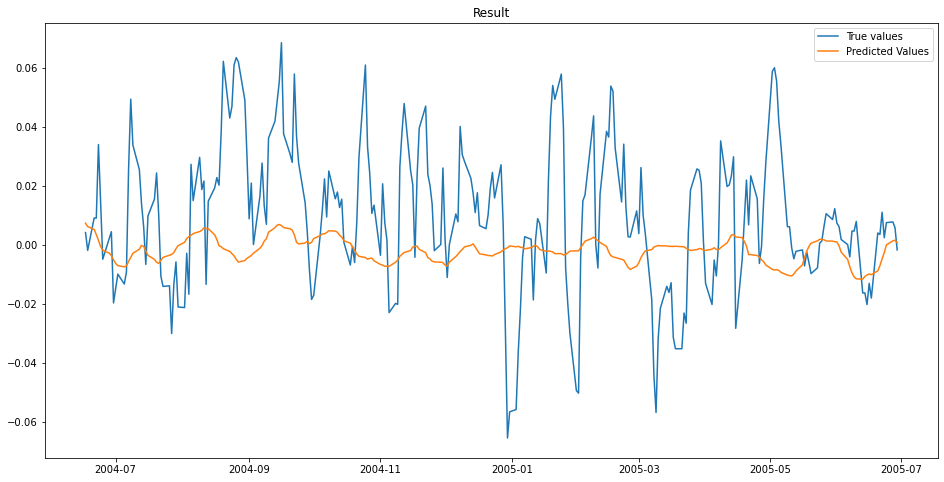


MSE: 0.0007143513328186423

Iteration No: 63 ended. Search finished for the next optimal point.
Time taken: 21.9607
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 64 started. Searching for the next optimal point.

learning rate: 0.0006370476255118749
num_input_nodes: 225
dropout: 0.25
sequence_length : 120
batch_size: 242



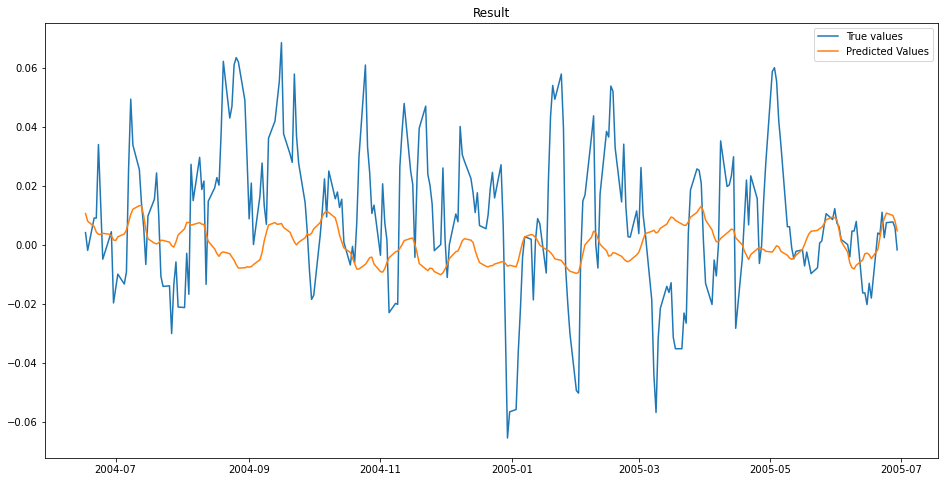


MSE: 0.0007042398760533827

Iteration No: 64 ended. Search finished for the next optimal point.
Time taken: 14.2400
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 65 started. Searching for the next optimal point.

learning rate: 0.00350690461936948
num_input_nodes: 226
dropout: 0.0
sequence_length : 120
batch_size: 84



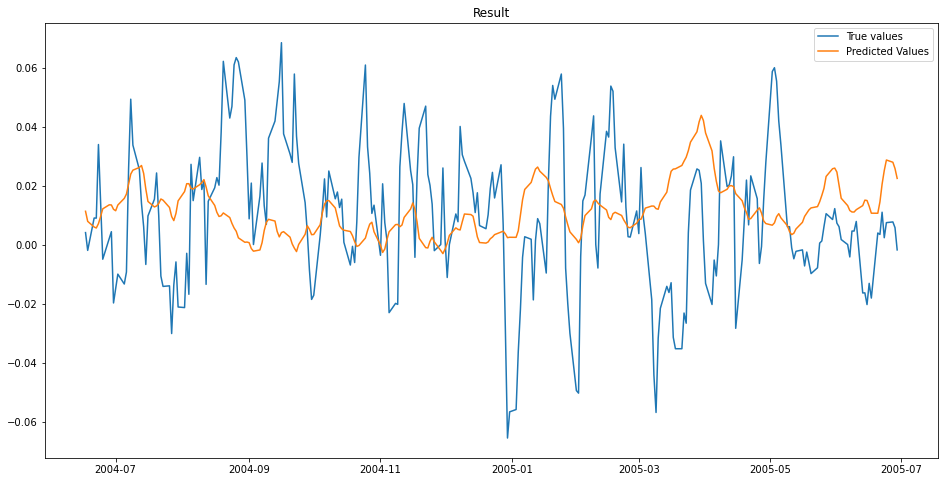


MSE: 0.0007195544606867965

Iteration No: 65 ended. Search finished for the next optimal point.
Time taken: 18.0471
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 66 started. Searching for the next optimal point.

learning rate: 0.0035819568179139482
num_input_nodes: 98
dropout: 0.24658850626184672
sequence_length : 120
batch_size: 98



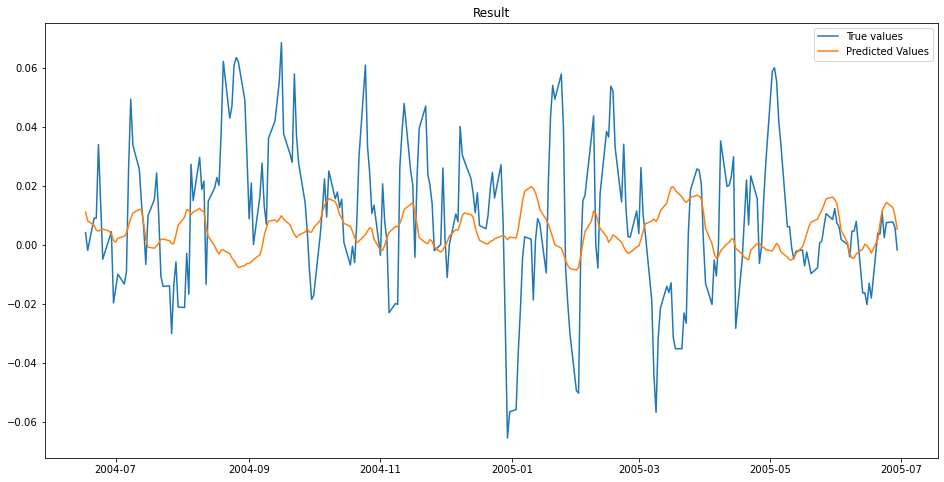


MSE: 0.0006735502143449654

Iteration No: 66 ended. Search finished for the next optimal point.
Time taken: 12.3589
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 67 started. Searching for the next optimal point.

learning rate: 0.00014476706831299192
num_input_nodes: 203
dropout: 0.14726485363284803
sequence_length : 200
batch_size: 166



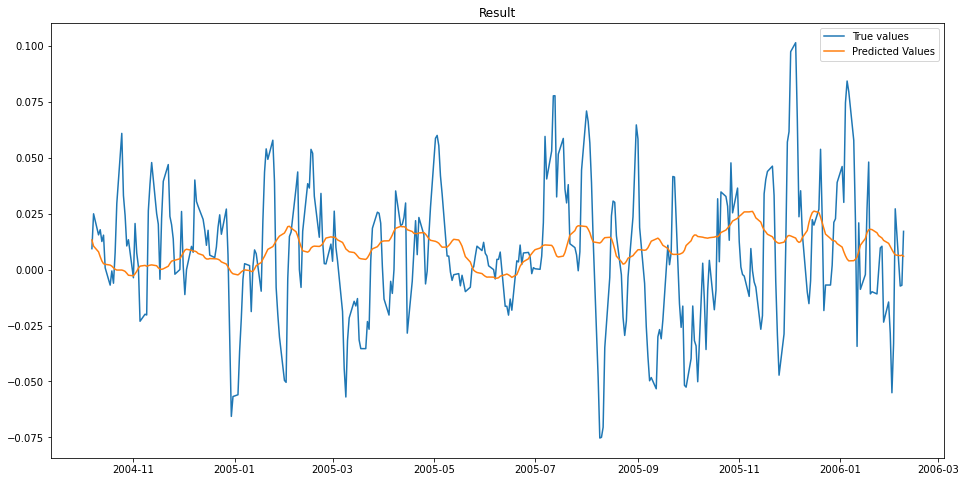


MSE: 0.0009138046352353361

Iteration No: 67 ended. Search finished for the next optimal point.
Time taken: 17.2620
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 68 started. Searching for the next optimal point.

learning rate: 0.0001703614412866861
num_input_nodes: 254
dropout: 0.19476335722100108
sequence_length : 100
batch_size: 245



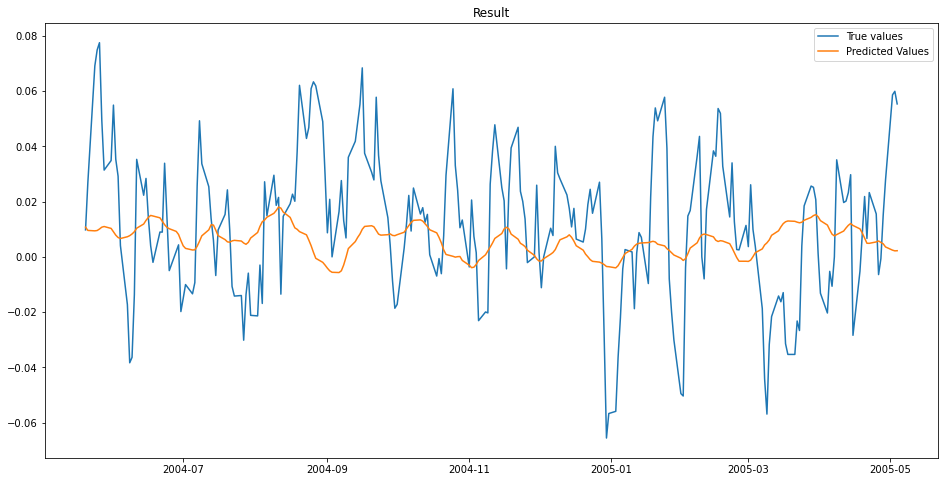


MSE: 0.0007230468980797704

Iteration No: 68 ended. Search finished for the next optimal point.
Time taken: 13.9674
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 69 started. Searching for the next optimal point.

learning rate: 0.00022898042712449123
num_input_nodes: 142
dropout: 0.017850679904295817
sequence_length : 167
batch_size: 36



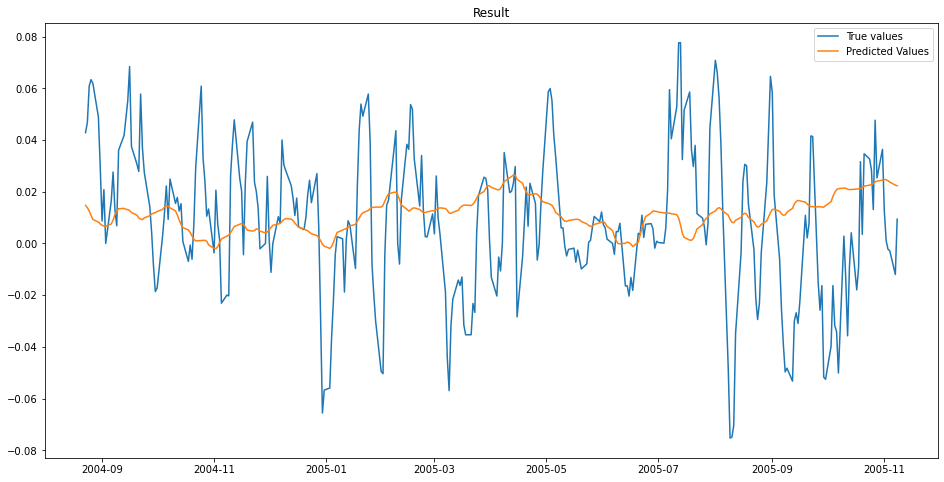


MSE: 0.0008608194617481587

Iteration No: 69 ended. Search finished for the next optimal point.
Time taken: 21.7936
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 70 started. Searching for the next optimal point.

learning rate: 0.00415313472997089
num_input_nodes: 163
dropout: 0.011486325079716865
sequence_length : 174
batch_size: 106



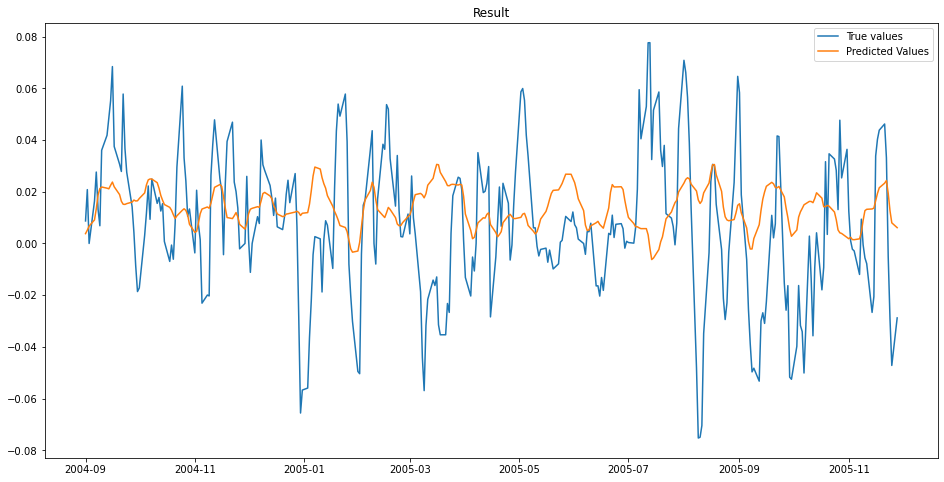


MSE: 0.0008806343287222611

Iteration No: 70 ended. Search finished for the next optimal point.
Time taken: 17.0564
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 71 started. Searching for the next optimal point.

learning rate: 0.00020088470379658476
num_input_nodes: 104
dropout: 0.24969938949953735
sequence_length : 119
batch_size: 110



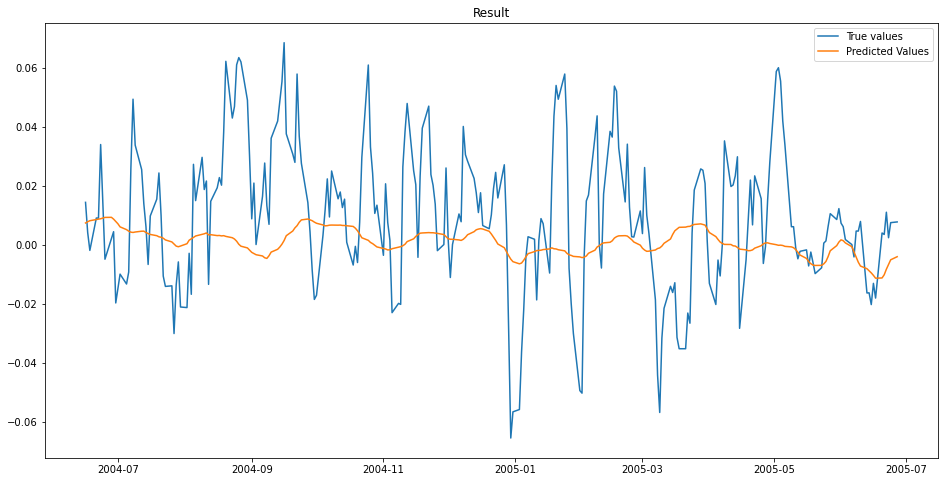


MSE: 0.0006354978492118994

Iteration No: 71 ended. Search finished for the next optimal point.
Time taken: 12.5584
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 72 started. Searching for the next optimal point.

learning rate: 0.001934714882000995
num_input_nodes: 14
dropout: 0.1496472888041074
sequence_length : 176
batch_size: 40



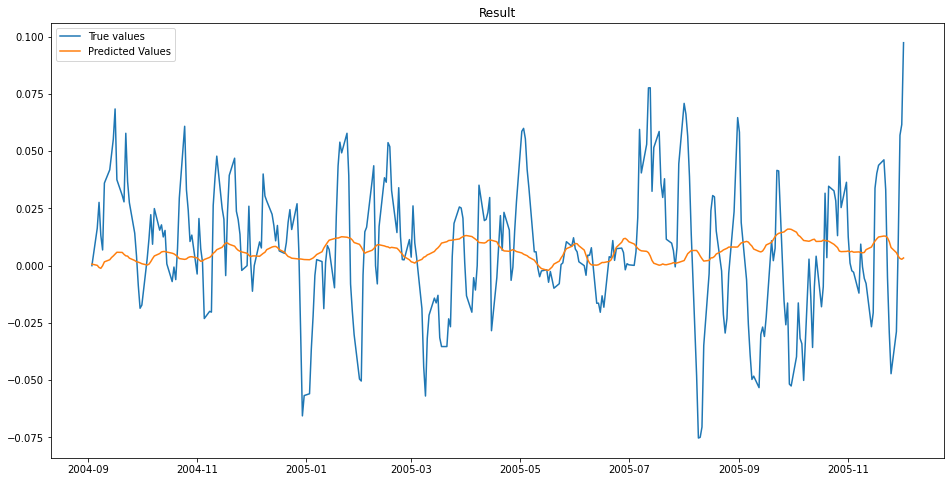


MSE: 0.0008730515510323654

Iteration No: 72 ended. Search finished for the next optimal point.
Time taken: 14.4931
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 73 started. Searching for the next optimal point.

learning rate: 0.0001960116571995673
num_input_nodes: 238
dropout: 0.016410823138326067
sequence_length : 128
batch_size: 216



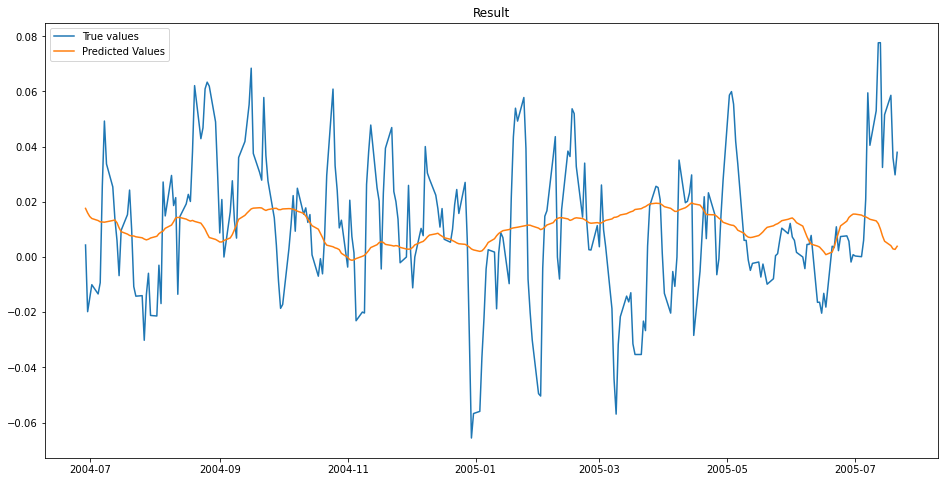


MSE: 0.0006449929743651108

Iteration No: 73 ended. Search finished for the next optimal point.
Time taken: 14.3279
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 74 started. Searching for the next optimal point.

learning rate: 0.0016564469777783752
num_input_nodes: 168
dropout: 0.10476539484311784
sequence_length : 179
batch_size: 71



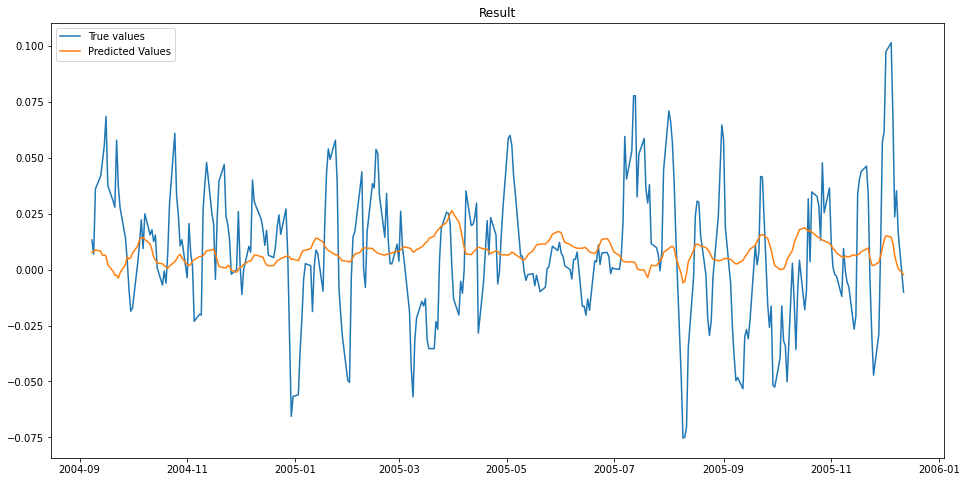


MSE: 0.0008765955367112001

Iteration No: 74 ended. Search finished for the next optimal point.
Time taken: 25.3052
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 75 started. Searching for the next optimal point.

learning rate: 0.00020458807202446572
num_input_nodes: 88
dropout: 0.2289375289856191
sequence_length : 199
batch_size: 222



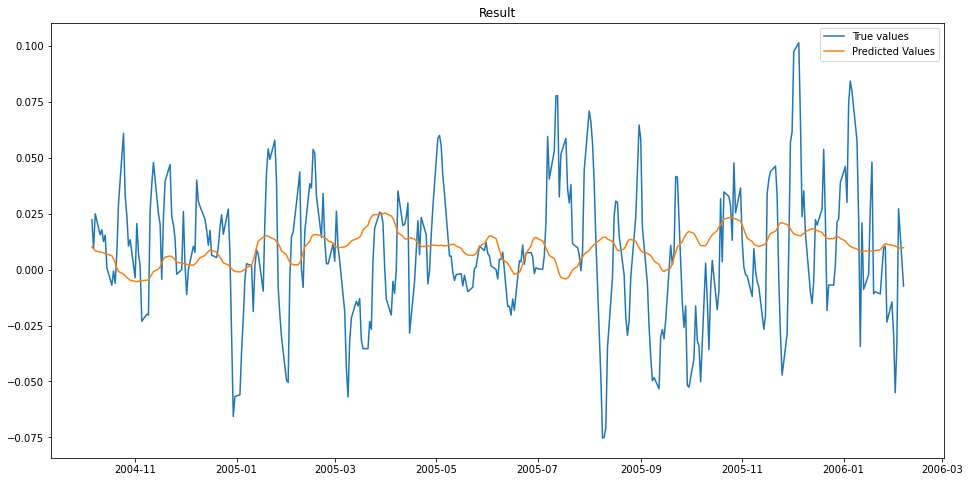


MSE: 0.0009367617765696272

Iteration No: 75 ended. Search finished for the next optimal point.
Time taken: 13.1614
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 76 started. Searching for the next optimal point.

learning rate: 0.00936354814193516
num_input_nodes: 58
dropout: 0.018650182734457125
sequence_length : 177
batch_size: 155



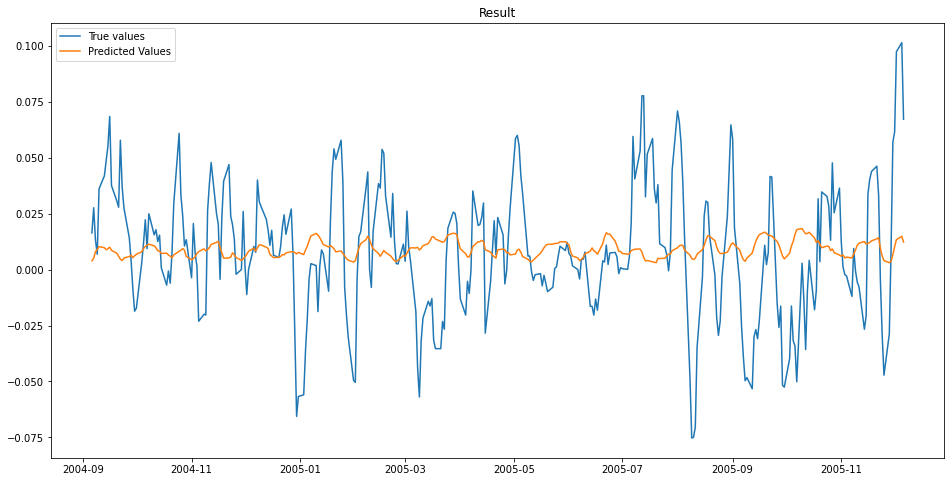


MSE: 0.0008707916551608147

Iteration No: 76 ended. Search finished for the next optimal point.
Time taken: 12.0343
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 77 started. Searching for the next optimal point.

learning rate: 0.0006277318630327672
num_input_nodes: 170
dropout: 0.17310481009819254
sequence_length : 195
batch_size: 179



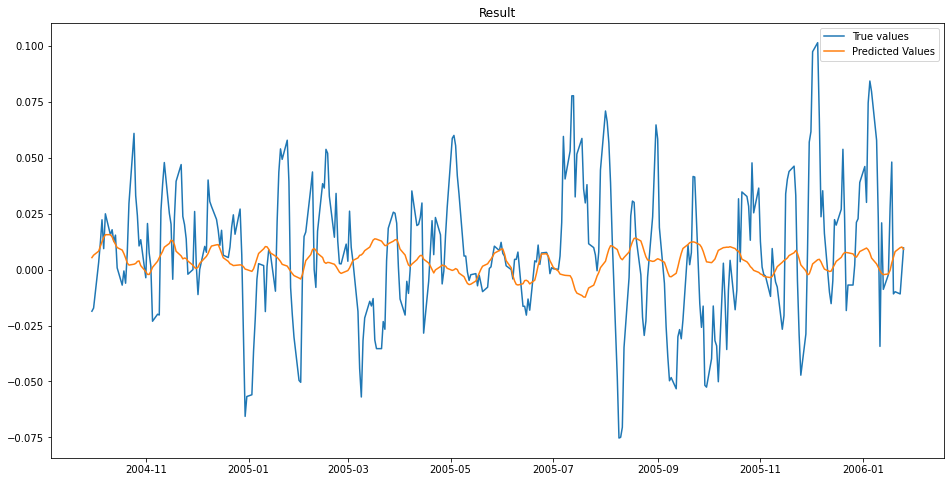


MSE: 0.0009334505022041721

Iteration No: 77 ended. Search finished for the next optimal point.
Time taken: 15.7981
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 78 started. Searching for the next optimal point.

learning rate: 0.003231746401007807
num_input_nodes: 255
dropout: 0.013119058012330629
sequence_length : 120
batch_size: 9



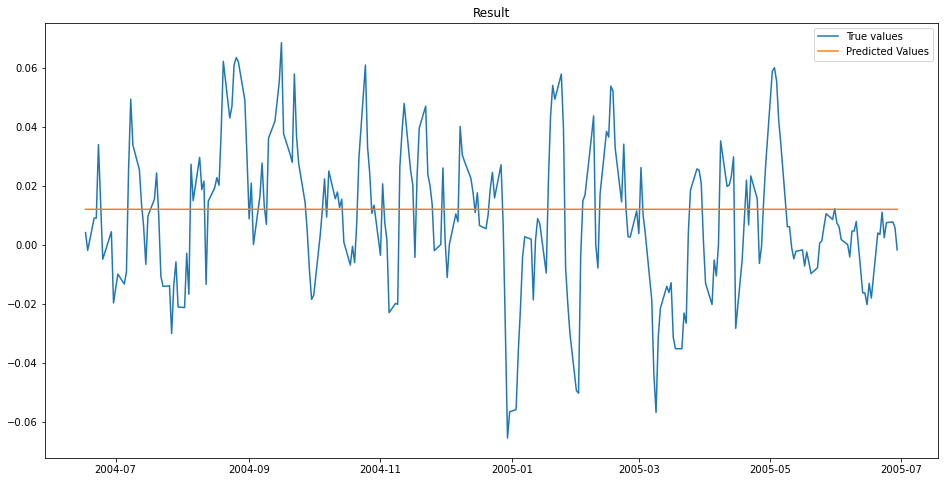


MSE: 0.0005874157981445727

Iteration No: 78 ended. Search finished for the next optimal point.
Time taken: 68.1507
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 79 started. Searching for the next optimal point.

learning rate: 0.0024768316121782804
num_input_nodes: 166
dropout: 0.015770349364863216
sequence_length : 128
batch_size: 83



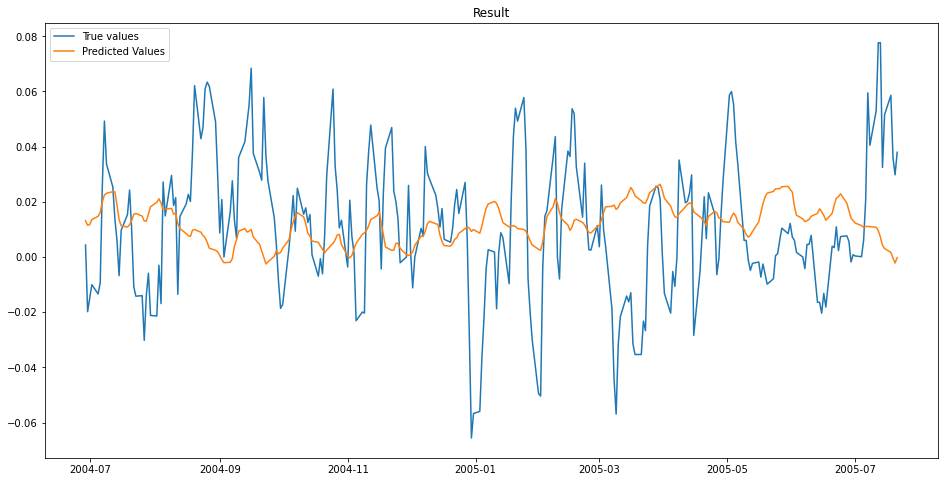


MSE: 0.0007546685195817955

Iteration No: 79 ended. Search finished for the next optimal point.
Time taken: 21.8383
Function value obtained: 0.0008
Current minimum: 0.0006
Iteration No: 80 started. Searching for the next optimal point.

learning rate: 0.0011848875333369338
num_input_nodes: 148
dropout: 0.1820547760128416
sequence_length : 186
batch_size: 112



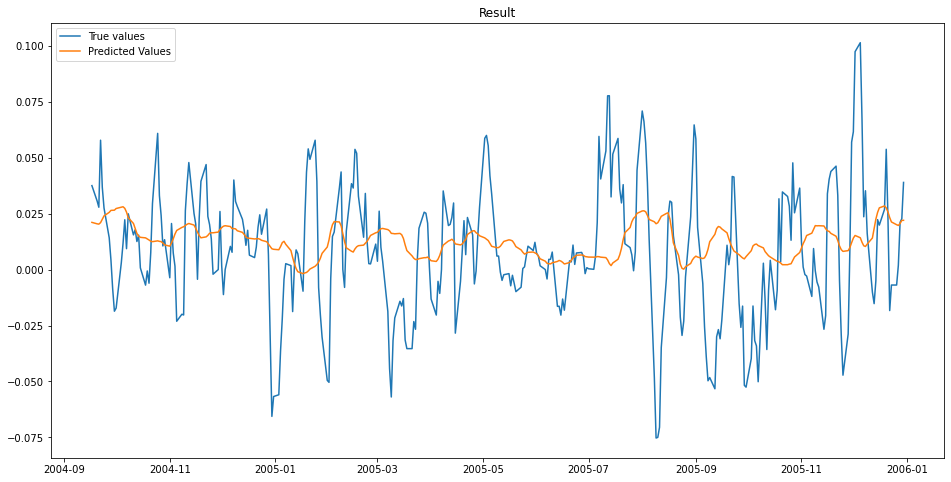


MSE: 0.0008938668529467913

Iteration No: 80 ended. Search finished for the next optimal point.
Time taken: 14.6362
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 81 started. Searching for the next optimal point.

learning rate: 0.00015933698164376247
num_input_nodes: 218
dropout: 0.2477746057375218
sequence_length : 119
batch_size: 6



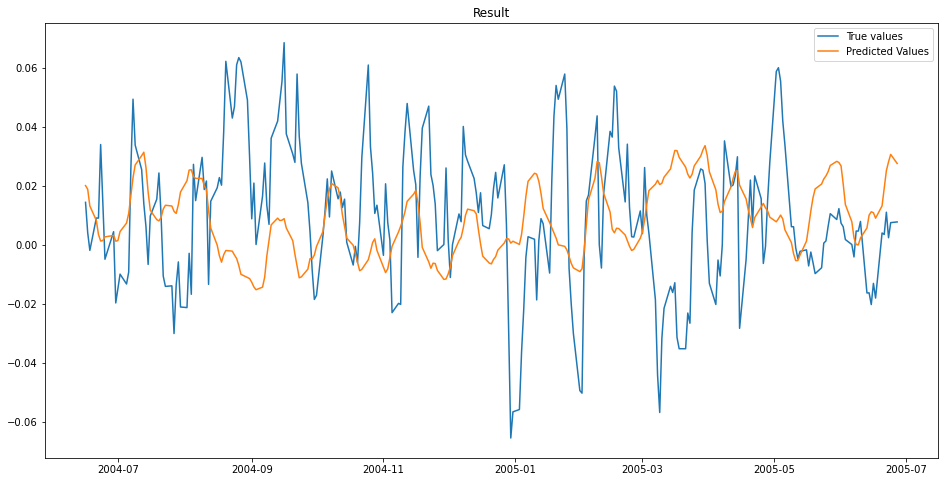


MSE: 0.000812760153636467

Iteration No: 81 ended. Search finished for the next optimal point.
Time taken: 63.7464
Function value obtained: 0.0008
Current minimum: 0.0006
Iteration No: 82 started. Searching for the next optimal point.

learning rate: 0.002827388517269168
num_input_nodes: 209
dropout: 0.17279149398322147
sequence_length : 117
batch_size: 247



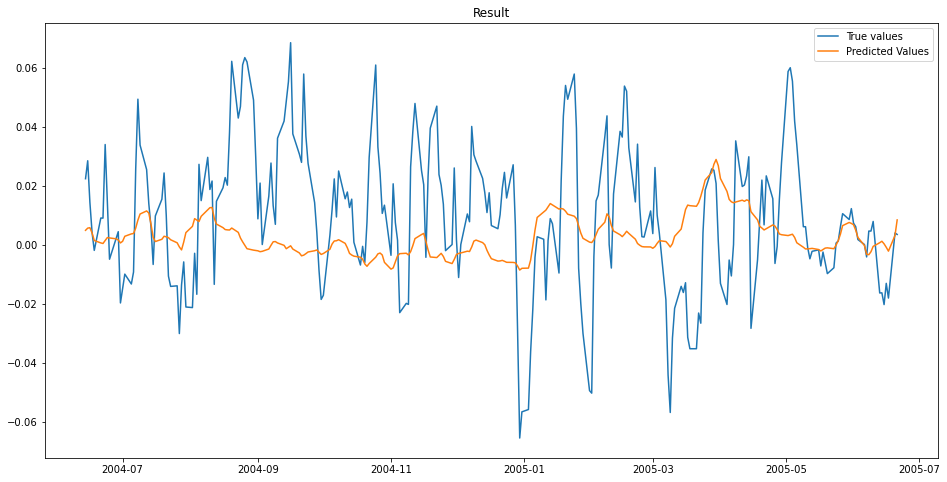


MSE: 0.0006652284087694047

Iteration No: 82 ended. Search finished for the next optimal point.
Time taken: 14.4994
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 83 started. Searching for the next optimal point.

learning rate: 0.0010175461262211167
num_input_nodes: 159
dropout: 0.21268918654950092
sequence_length : 117
batch_size: 96



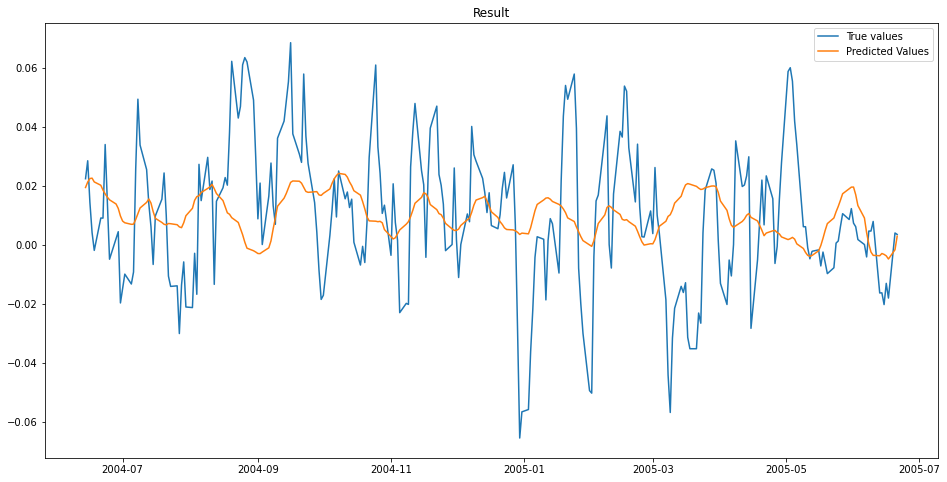


MSE: 0.0006050058862869757

Iteration No: 83 ended. Search finished for the next optimal point.
Time taken: 13.1990
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 84 started. Searching for the next optimal point.

learning rate: 0.0019620658397930023
num_input_nodes: 247
dropout: 0.0796603052293783
sequence_length : 141
batch_size: 82



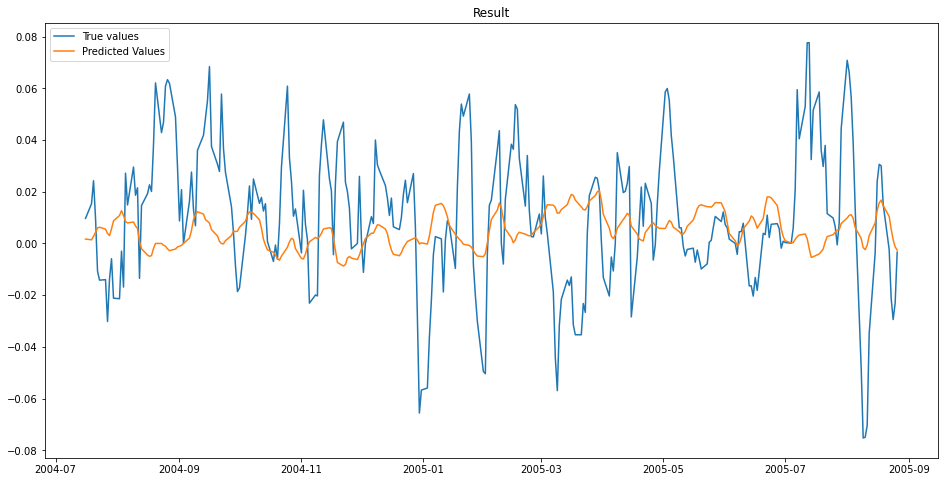


MSE: 0.0008409385657779666

Iteration No: 84 ended. Search finished for the next optimal point.
Time taken: 21.7695
Function value obtained: 0.0008
Current minimum: 0.0006
Iteration No: 85 started. Searching for the next optimal point.

learning rate: 0.008043191210903316
num_input_nodes: 42
dropout: 0.22844898929603968
sequence_length : 113
batch_size: 68



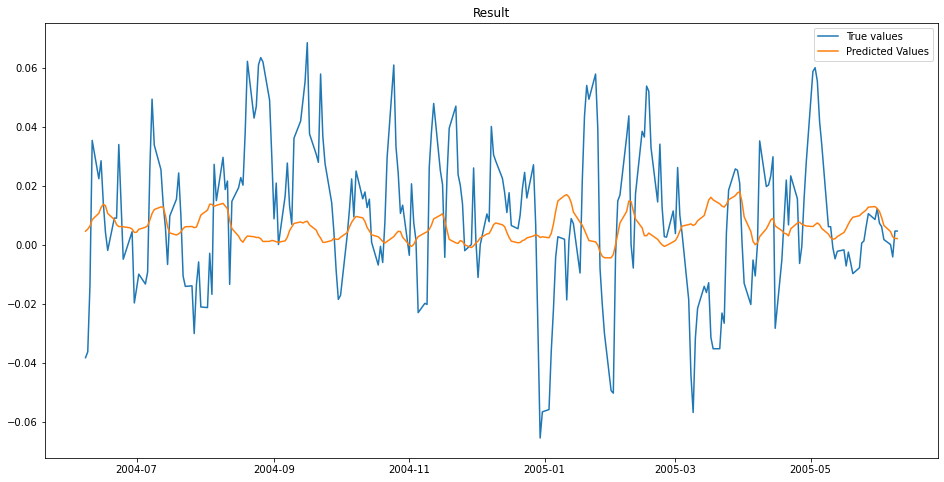


MSE: 0.0006504904876211541

Iteration No: 85 ended. Search finished for the next optimal point.
Time taken: 12.9034
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 86 started. Searching for the next optimal point.

learning rate: 0.0038009778724640993
num_input_nodes: 232
dropout: 0.12491961823757344
sequence_length : 136
batch_size: 71



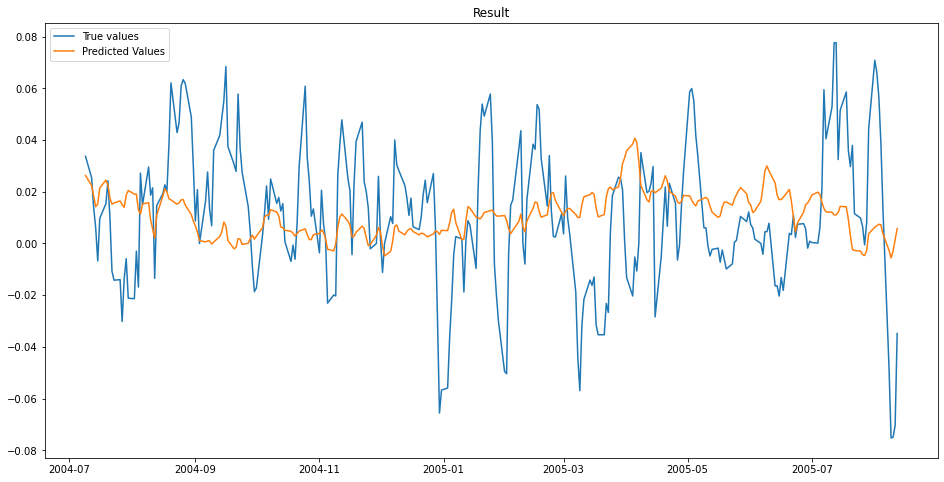


MSE: 0.0007967161413136724

Iteration No: 86 ended. Search finished for the next optimal point.
Time taken: 23.9236
Function value obtained: 0.0008
Current minimum: 0.0006
Iteration No: 87 started. Searching for the next optimal point.

learning rate: 0.005333059284877444
num_input_nodes: 28
dropout: 0.10729957267690465
sequence_length : 105
batch_size: 246



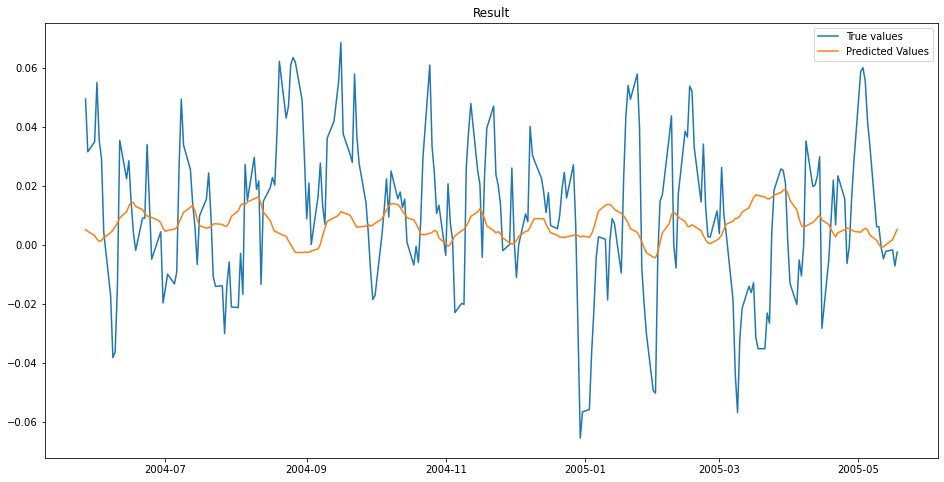


MSE: 0.000695494776329963

Iteration No: 87 ended. Search finished for the next optimal point.
Time taken: 10.1520
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 88 started. Searching for the next optimal point.

learning rate: 0.0001477443660864128
num_input_nodes: 152
dropout: 0.13384018712408904
sequence_length : 181
batch_size: 59



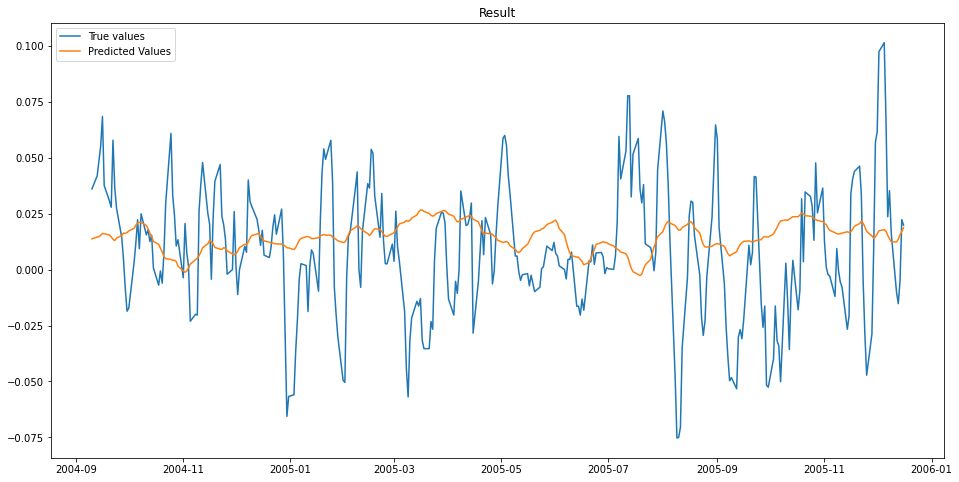


MSE: 0.0009732962496574375

Iteration No: 88 ended. Search finished for the next optimal point.
Time taken: 18.2148
Function value obtained: 0.0010
Current minimum: 0.0006
Iteration No: 89 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 6
dropout: 0.11293712529049436
sequence_length : 119
batch_size: 233



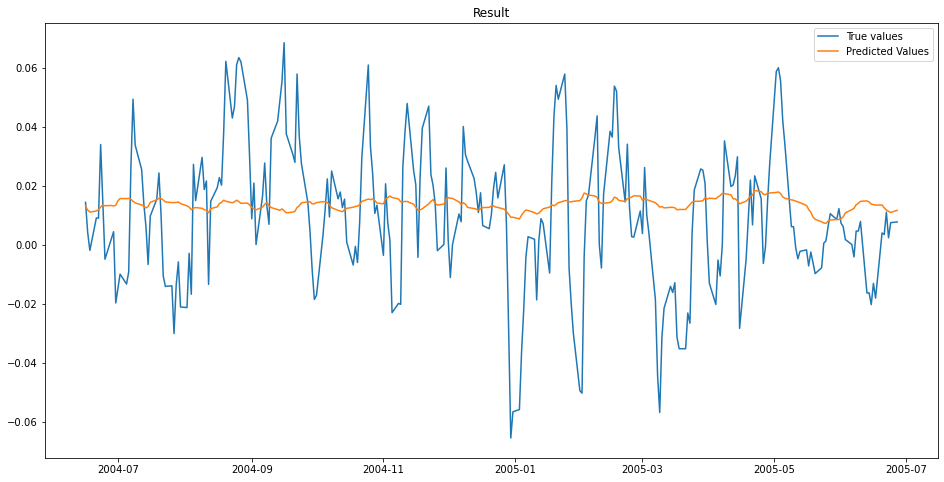


MSE: 0.0005811706204650351

Iteration No: 89 ended. Search finished for the next optimal point.
Time taken: 9.8424
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 90 started. Searching for the next optimal point.

learning rate: 0.003733473307491649
num_input_nodes: 106
dropout: 0.1397351285801814
sequence_length : 131
batch_size: 27



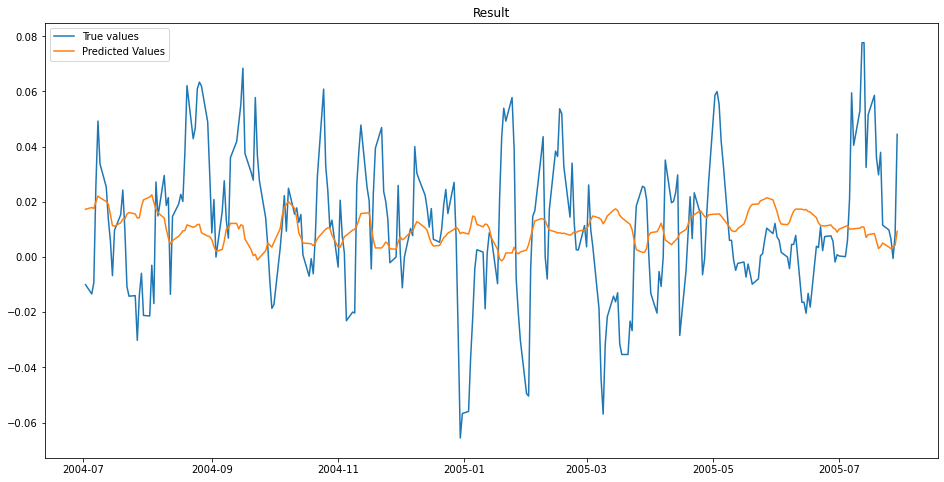


MSE: 0.0006912319408597637

Iteration No: 90 ended. Search finished for the next optimal point.
Time taken: 33.2437
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 91 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 60
dropout: 0.14254316775687745
sequence_length : 119
batch_size: 16



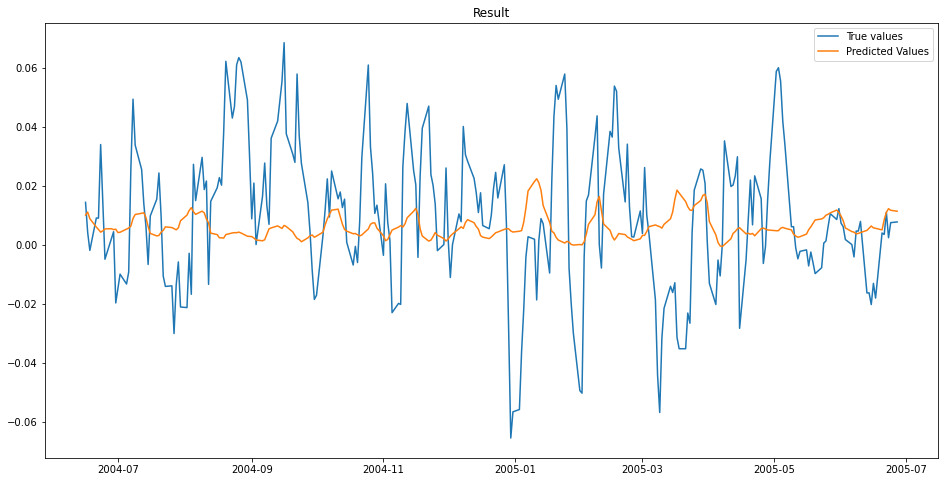


MSE: 0.0006363042765299288

Iteration No: 91 ended. Search finished for the next optimal point.
Time taken: 24.9382
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 92 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 58
dropout: 0.13404538713232853
sequence_length : 119
batch_size: 101



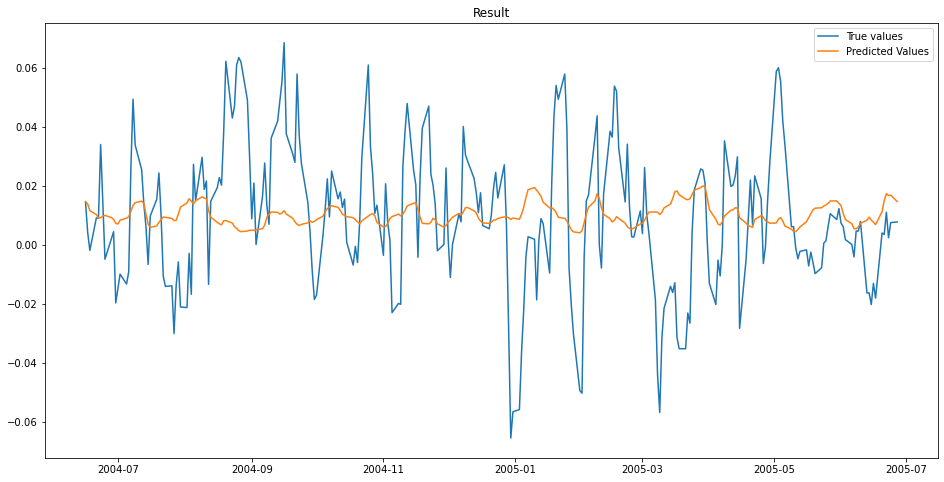


MSE: 0.0006048206443715519

Iteration No: 92 ended. Search finished for the next optimal point.
Time taken: 12.1811
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 93 started. Searching for the next optimal point.

learning rate: 0.001454010611221609
num_input_nodes: 52
dropout: 0.09308903147973126
sequence_length : 116
batch_size: 182



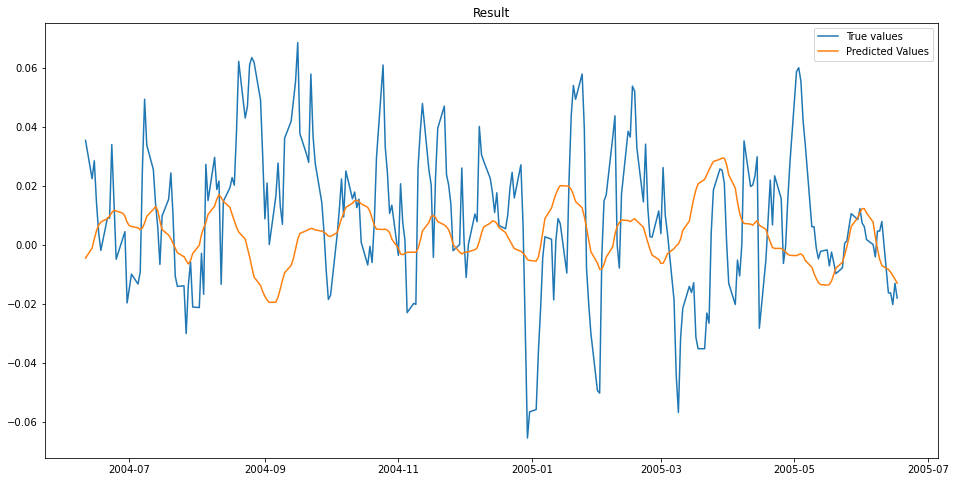


MSE: 0.000696332254773046

Iteration No: 93 ended. Search finished for the next optimal point.
Time taken: 9.9492
Function value obtained: 0.0007
Current minimum: 0.0006
Iteration No: 94 started. Searching for the next optimal point.

learning rate: 0.00013922483491784666
num_input_nodes: 57
dropout: 0.00809265959299685
sequence_length : 154
batch_size: 51



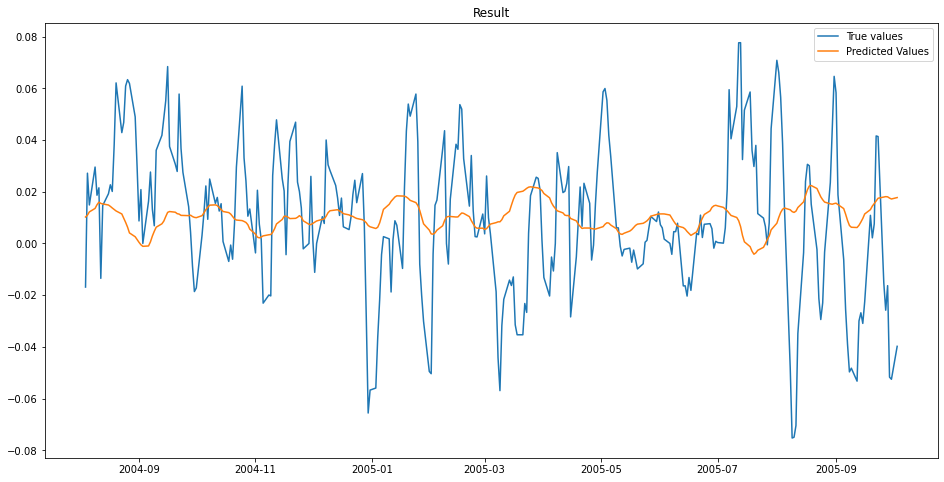


MSE: 0.0008662092814450612

Iteration No: 94 ended. Search finished for the next optimal point.
Time taken: 18.7763
Function value obtained: 0.0009
Current minimum: 0.0006
Iteration No: 95 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 12
dropout: 0.21036904251229285
sequence_length : 119
batch_size: 33



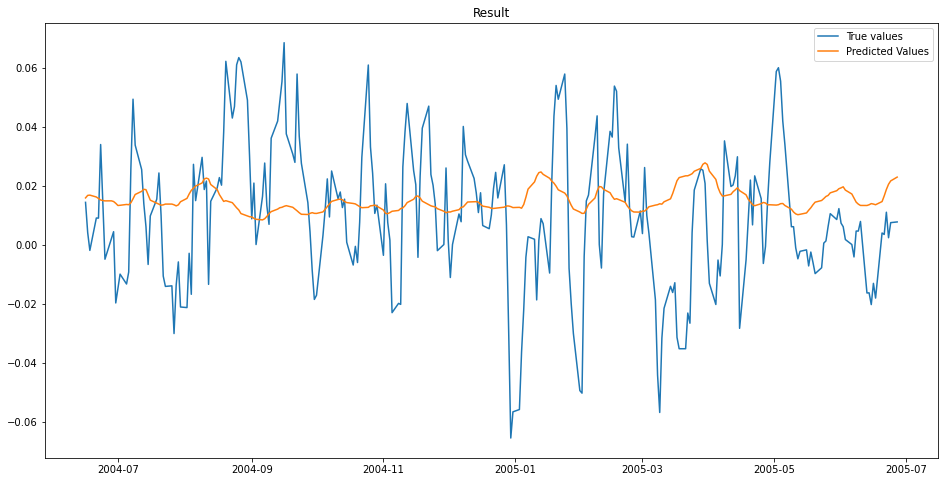


MSE: 0.0006357519567695083

Iteration No: 95 ended. Search finished for the next optimal point.
Time taken: 15.6126
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 96 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 244
dropout: 0.006212632035895574
sequence_length : 119
batch_size: 113



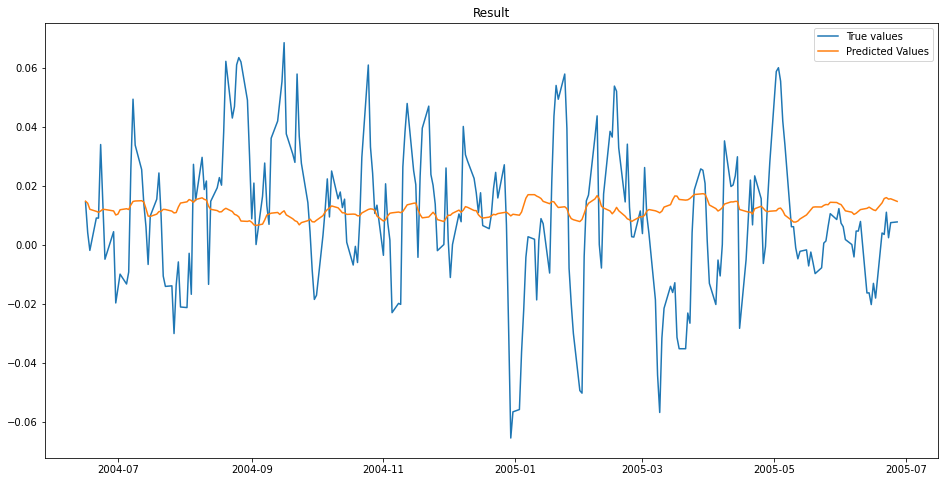


MSE: 0.0005941396288838653

Iteration No: 96 ended. Search finished for the next optimal point.
Time taken: 20.6748
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 97 started. Searching for the next optimal point.

learning rate: 0.0002890880806223456
num_input_nodes: 237
dropout: 0.12307850504510529
sequence_length : 160
batch_size: 232



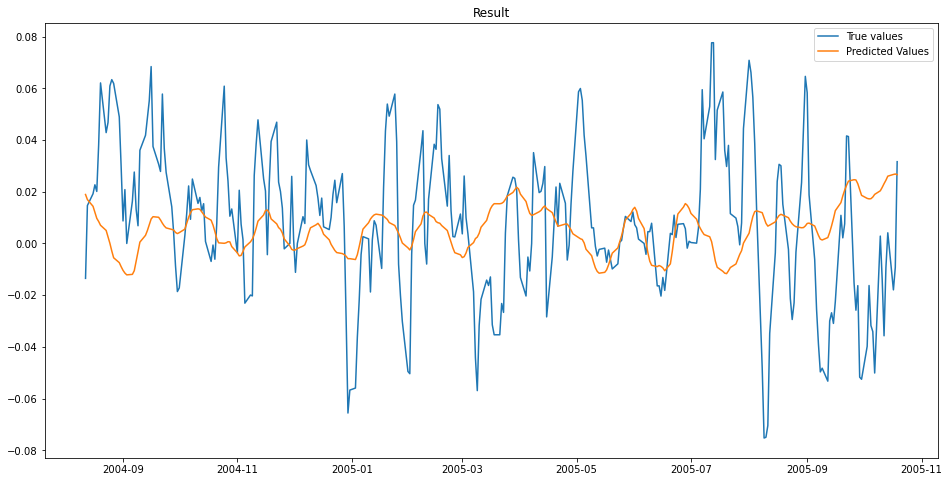


MSE: 0.0009642190034634726

Iteration No: 97 ended. Search finished for the next optimal point.
Time taken: 15.6478
Function value obtained: 0.0010
Current minimum: 0.0006
Iteration No: 98 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 24
dropout: 0.2179989154815915
sequence_length : 119
batch_size: 245



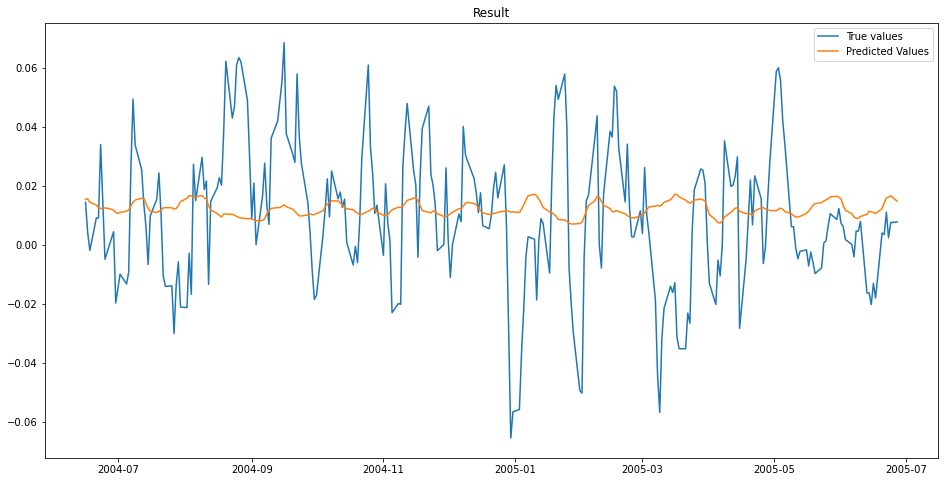


MSE: 0.0006001667502884962

Iteration No: 98 ended. Search finished for the next optimal point.
Time taken: 10.6773
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 99 started. Searching for the next optimal point.

learning rate: 0.01
num_input_nodes: 13
dropout: 0.22213190750723855
sequence_length : 119
batch_size: 26



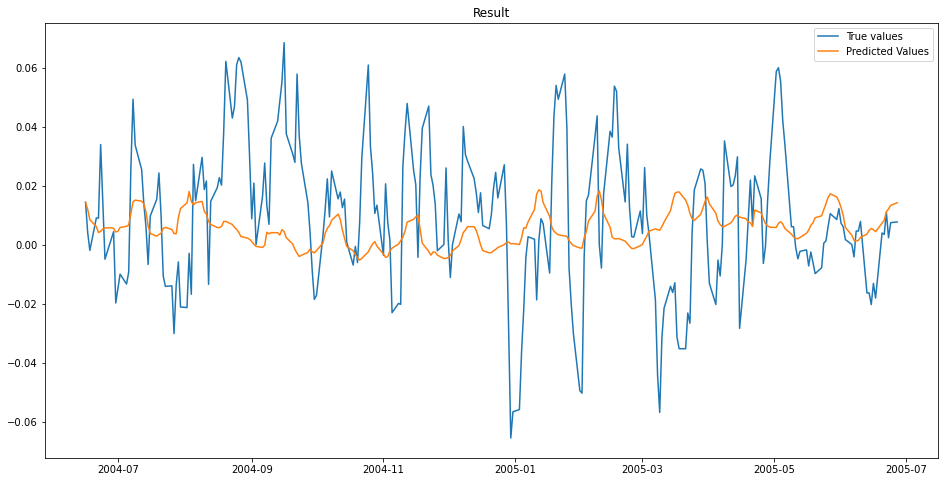


MSE: 0.0006483003409004719

Iteration No: 99 ended. Search finished for the next optimal point.
Time taken: 23.7019
Function value obtained: 0.0006
Current minimum: 0.0006
Iteration No: 100 started. Searching for the next optimal point.

learning rate: 0.00011721775002593032
num_input_nodes: 39
dropout: 0.12976722869907892
sequence_length : 174
batch_size: 136



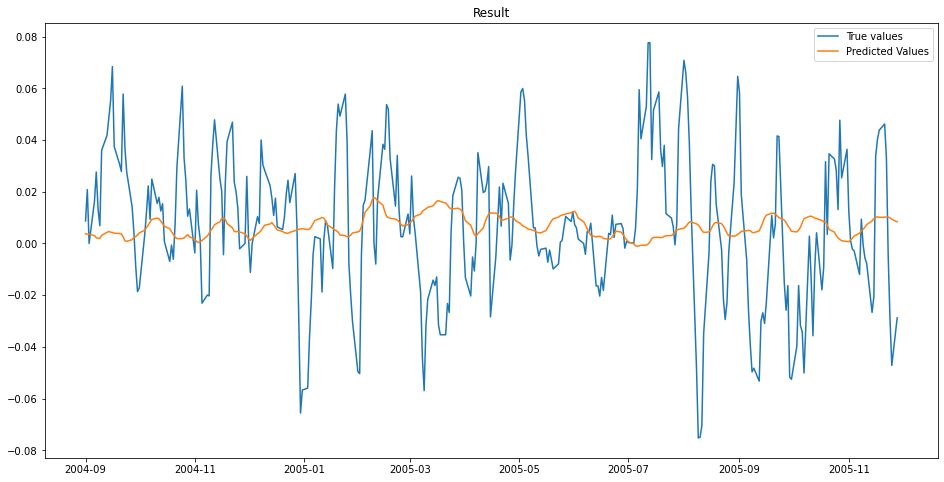


MSE: 0.0008535396353778183

Iteration No: 100 ended. Search finished for the next optimal point.
Time taken: 13.0090
Function value obtained: 0.0009
Current minimum: 0.0006


In [10]:
gp_result = gp_minimize(func=fitness,
                            dimensions=dimensions,
                            n_jobs=-1,
                            n_random_starts=10,
                            verbose=True,
                            x0=default_parameters,
                            random_state=randseed)

**Summary of configurations and results**

In [11]:
res = pd.concat([pd.DataFrame(gp_result.x_iters, columns = ['learning_rate', 'num_input_nodes', 'dropout', 'sequencelength', 'batch_size']),(pd.Series(gp_result.func_vals, name="mse"))], axis=1)
res = res.sort_values(by='mse')
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(res)

,learning_rate,num_input_nodes,dropout,sequencelength,batch_size,mse
20,0.000446,174,0.200369,124,250,0.000572
88,0.010000,6,0.112937,119,233,0.000581
8,0.000590,9,0.057723,124,171,0.000582
77,0.003232,255,0.013119,120,9,0.000587
56,0.000839,21,0.249023,120,194,0.000589
48,0.008284,183,0.233121,120,12,0.000591
95,0.010000,244,0.006213,119,113,0.000594
97,0.010000,24,0.217999,119,245,0.000600
91,0.010000,58,0.134045,119,101,0.000605
82,0.001018,159,0.212689,117,96,0.000605
